**<h1>Bài tập thục hành về EDA</h1>**

# **I. Thống kê mô tả**

## Bài 1: Thực hiện thống kê mô tả trên tập dữ liệu về phân loại chất lượng rượu đỏ.
Dữ liệu lấy tại https://www.kaggle.com/code/eisgandar/red-wine-quality-eda-classification

### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


Tập dữ liệu rượu vang đỏ được thu thập từ các mẫu rượu vùng Vinho Verde, Bồ Đào Nha. Dữ liệu này nhằm hỗ trợ việc đánh giá và phân loại chất lượng rượu vang dựa trên các chỉ số hóa học đo lường được.

#### 1.2. Mô tả các biến


+ fixed acidity – độ axit cố định
+ volatile acidity – độ axit bay hơi
+ citric acid – lượng axit citric
+ residual sugar – lượng đường dư
+ chlorides – muối (clorua)
+ free sulfur dioxide – SO₂ tự do
+ total sulfur dioxide – tổng SO₂
+ density – mật độ
+ pH – độ pH
+ sulphates – lượng sulphates
+ alcohol – nồng độ cồn (%)
+ quality – nhãn đánh giá chất lượng (0–10)

### **2. THỰC HÀNH**


#### 2.1. Tính mean, median, mode, variance, standard deviation, range, percentile, quartile, interquartile range (IQR) sử dụng thư viện numpy và stats trên tập dữ liệu


##### Import thư viện

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats

##### Load dataset

In [ ]:
df = pd.read_csv("winequality-red.csv")

##### Thống kê mô tả

+ Xem bộ dữ liệu, kiểu dữ liệu

In [ ]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
df.dtypes

,0
fixed acidity,float64
volatile acidity,float64
citric acid,float64
residual sugar,float64
chlorides,float64
free sulfur dioxide,float64
total sulfur dioxide,float64
density,float64
pH,float64
sulphates,float64


In [ ]:
df.shape

(1599, 12)

**Nhận xét:**
+ Bộ dữ liệu có 1599 dòng và 12 cột

###### Tính mean, median, mode, variance, standard deviation, range, percentile, quartile, interquartile range (IQR) chất lượng rượu đỏ

In [ ]:
print("Mean:", df['quality'].mean())
print("Median:", df['quality'].median())
print("Mode:", df['quality'].mode().values)
print("Variance:", df['quality'].var())
print("Std dev:", df['quality'].std())
print("Min:", df['quality'].min())
print("Max:", df['quality'].max())
print("25%:", df['quality'].quantile(0.25))
print("75%:", df['quality'].quantile(0.75))
print("IQR:", stats.iqr(df['quality']))

Mean: 5.6360225140712945
Median: 6.0
Mode: [5]
Variance: 0.6521683999934209
Std dev: 0.8075694397347023
Min: 3
Max: 8
25%: 5.0
75%: 6.0
IQR: 1.0


**Nhận xét:**
+ Mean (Trung bình) ≈ 5.63: Điểm chất lượng trung bình nằm khoảng 5.6, tức phần lớn rượu đỏ trong tập dữ liệu chỉ ở mức trung bình.
+ Chất lượng rượu đỏ chủ yếu tập trung ở mức 5 và 6.
+ Phương sai ≈ 0.65, Độ lệch chuẩn ≈ 0.81: Độ phân tán nhỏ, dữ liệu tập trung quanh giá trị trung bình (5-6).
+ Vì mean < median, chứng tỏ có một số điểm chất lượng thấp (3, 4) kéo giá trị trung bình xuống dưới mức 6. Điều này làm phân phối hơi “lệch trái”.

#### 2.2. Loại bỏ dữ liệu trùng lặp, thay thế dữ liệu và thay đổi định dạng của dữ liệu và xử lý dữ liệu thiếu


+ Loại bỏ dữ liệu bị trùng lặp

In [ ]:
# Loại bỏ dữ liệu trùng lặp
df_duplicate = df.drop_duplicates()

# Xóa một hàng cụ thể (ví dụ hàng có index = 1)
df = df.drop(labels=[1], axis=0)

# Xóa một cột (ví dụ cột 'pH')
df = df.drop(labels=['pH'], axis=1)

+ Thay thế dữ liệu

In [ ]:
# Thay giá trị trong cột 'quality': <6 là 'low', >=6 là 'high'
df['quality_replaced'] = df['quality'].replace(
    [3,4,5], 'low'
).replace(
    [6,7,8], 'high'
)

# Điền giá trị thiếu trong cột 'alcohol' bằng 0
df['alcohol'] = df['alcohol'].fillna(0)

# Đổi kiểu dữ liệu của cột 'alcohol' từ float sang int
df['alcohol_changed'] = df['alcohol'].astype(int)

+ Xử lý dữ liệu thiếu

In [ ]:
# Kiểm tra số lượng giá trị thiếu trong từng cột
df.isnull().sum()

,0
fixed acidity,0
volatile acidity,0
citric acid,0
residual sugar,0
chlorides,0
free sulfur dioxide,0
total sulfur dioxide,0
density,0
sulphates,0
alcohol,0


**Nhận xét:**
+ Không có dữ liệu thiếu

In [ ]:
df.shape

(1598, 13)

**Nhận xét:**
+ Sau khi loại bỏ một dòng và cột bất kỳ thì dữ liệu còn 1598 dòng và 13 cột



---



## Bài 2: Thực hiện thống kê mô tả trên tập dữ liệu về bệnh tiểu đường.
Dữ liệu lấy tại:
https://www.kaggle.com/code/vincentlugat/pima-indians-diabetes-eda-prediction-0-906

### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


Tập dữ liệu này được thu thập từ các bệnh nhân thuộc dân tộc Pima Indian tại Mỹ, nhằm mục tiêu hỗ trợ chẩn đoán bệnh tiểu đường dựa trên các chỉ số y khoa.

#### 1.2. Mô tả các biến


+ **Dữ liệu vào**:
    + Số lần mang thai (Pregnancies)
    + Nồng độ glucose huyết tương (Glucose)
    + Huyết áp (BloodPressure)
    + Độ dày lớp mỡ dưới da (SkinThickness)
    + Nồng độ insulin huyết tương (Insulin)
    + Chỉ số khối cơ thể (BMI)
    + Khả năng di truyền tiểu đường (DiabetesPedigreeFunction)
    + Tuổi (Age)
+ **Kết quả**:
    + 0: Không bị tiểu đường.
    + 1: Bị tiểu đường.

### **2. THỰC HÀNH**


#### 2.1. Tính mean, median, mode, variance, standard deviation, range, percentile, quartile, interquartile range (IQR) sử dụng thư viện numpy và stats trên tập dữ liệu


+ Import thư viện

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats

+ Load data

In [ ]:
column_names = ["pregnancies","glucose","bloodpressure","skinthickness","insulin","bmi","dpf","age","outcome"]
df = pd.read_csv("pima-indians-diabetes.data.csv",names=column_names)

+ Xem bộ dữ liệu, kiểu dữ liệu

In [ ]:
df.head()

,pregnancies,glucose,bloodpressure,skinthickness,insulin,bmi,dpf,age,outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
df.dtypes

,0
pregnancies,int64
glucose,int64
bloodpressure,int64
skinthickness,int64
insulin,int64
bmi,float64
dpf,float64
age,int64
outcome,int64


In [ ]:
df.shape

(768, 9)

**Nhận xét:**
+ Bộ dữ liệu có 768 dòng và 9 cột

###### Tính mean, median, mode, variance, standard deviation, range, percentile, quartile, interquartile range (IQR)

In [ ]:
for col in df.columns:
    print(f"\n=== {col} ===")
    print("Mean:", df[col].mean())
    print("Median:", df[col].median())
    print("Mode:", df[col].mode().values)
    print("Variance:", df[col].var())
    print("Std:", df[col].std())
    print("Min:", df[col].min())
    print("Max:", df[col].max())
    print("25%:", df[col].quantile(0.25))
    print("75%:", df[col].quantile(0.75))
    print("IQR:", stats.iqr(df[col]))


=== pregnancies ===
Mean: 3.8450520833333335
Median: 3.0
Mode: [1]
Variance: 11.35405632062142
Std: 3.3695780626988623
Min: 0
Max: 17
25%: 1.0
75%: 6.0
IQR: 5.0

=== glucose ===
Mean: 120.89453125
Median: 117.0
Mode: [ 99 100]
Variance: 1022.2483142519557
Std: 31.97261819513622
Min: 0
Max: 199
25%: 99.0
75%: 140.25
IQR: 41.25

=== bloodpressure ===
Mean: 69.10546875
Median: 72.0
Mode: [70]
Variance: 374.6472712271838
Std: 19.355807170644777
Min: 0
Max: 122
25%: 62.0
75%: 80.0
IQR: 18.0

=== skinthickness ===
Mean: 20.536458333333332
Median: 23.0
Mode: [0]
Variance: 254.47324532811953
Std: 15.952217567727677
Min: 0
Max: 99
25%: 0.0
75%: 32.0
IQR: 32.0

=== insulin ===
Mean: 79.79947916666667
Median: 30.5
Mode: [0]
Variance: 13281.180077955281
Std: 115.24400235133837
Min: 0
Max: 846
25%: 0.0
75%: 127.25
IQR: 127.25

=== bmi ===
Mean: 31.992578124999998
Median: 32.0
Mode: [32.]
Variance: 62.15998395738257
Std: 7.8841603203754405
Min: 0.0
Max: 67.1
25%: 27.3
75%: 36.6
IQR: 9.3

=== dpf ==

**Nhận xét:**
+ Các biến có giá trị bằng 0 bất hợp lý: Glucose, BloodPressure, SkinThickness, Insulin, BMI (có thể là missing value)
+ Một số biến lệch phải: Insulin, SkinThickness DiabetesPedigreeFunction. (do Mean > Median)

#### 2.2. Loại bỏ dữ liệu trùng lặp, thay thế dữ liệu và thay đổi định dạng của dữ liệu và xử lý dữ liệu thiếu


+ Loại bỏ dữ liệu bị trùng lặp

In [ ]:
# Loại bỏ dữ liệu trùng lặp
df = df.drop_duplicates()

# Xóa một cột cụ thể (ví dụ cột 'Insulin')
df = df.drop(labels=['insulin'], axis=1)

+ Thay thế dữ liệu

In [ ]:
#  Điền giá trị thiếu (ví dụ cột 'age') bằng 0
df['age'] = df['age'].fillna(0)

# Đổi kiểu dữ liệu của cột 'age' từ float sang int
df['age_change'] = df['age'].astype(int)

+ Xử lí dữ liệu thiếu

In [ ]:
df.isnull().sum()

,0
pregnancies,0
glucose,0
bloodpressure,0
skinthickness,0
bmi,0
dpf,0
age,0
outcome,0
age_change,0


**Nhận xét:**
+ Không có dữ liệu bị thiếu nhưng cần lưu ý các cột Glucose, BloodPressure, SkinThickness, Insulin, BMI có min = 0.

In [ ]:
df.shape

(768, 9)

**Nhận xét:**
+ Dữ liệu còn 766 dòng và 8 cột

# **II. Xử lý và trực quan hóa dữ liệu**

## Bài 1: Thực hiện trực quan hóa dữ liệu trên tập dữ liệu về phân loại chất lượng rượu đỏ.
Dữ liệu lấy tại
https://www.kaggle.com/code/eisgandar/red-wine-quality-eda-classification

### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


Tập dữ liệu rượu vang đỏ được thu thập từ các mẫu rượu vùng Vinho Verde, Bồ Đào Nha. Dữ liệu này nhằm hỗ trợ việc đánh giá và phân loại chất lượng rượu vang dựa trên các chỉ số hóa học đo lường được.

#### 1.2. Mô tả các biến


+ fixed acidity – độ axit cố định
+ volatile acidity – độ axit bay hơi
+ citric acid – lượng axit citric
+ residual sugar – lượng đường dư
+ chlorides – muối (clorua)
+ free sulfur dioxide – SO₂ tự do
+ total sulfur dioxide – tổng SO₂
+ density – mật độ
+ pH – độ pH
+ sulphates – lượng sulphates
+ alcohol – nồng độ cồn (%)
+ quality – nhãn đánh giá chất lượng (0–10)

### **2. THỰC HÀNH**


#### 2.1 Chuẩn bị dữ liệu cho trực quan hóa dữ liệu, trực quan hóa dữ liệu với thư viện Matplotlib và Seaborn


In [ ]:
df = pd.read_csv("/content/winequality-red.csv")

In [ ]:
# Xem 5 dòng đầu
print(df.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  
0      9.4        5  
1      9.8        5  
2      9.8        5 

In [ ]:
# --- 2. Thống kê cơ bản ---
print("\nThông tin dữ liệu:")
print(df.info())
print("\nThống kê mô tả:")
print(df.describe())


Thông tin dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
None

Thống kê mô tả:
       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1599

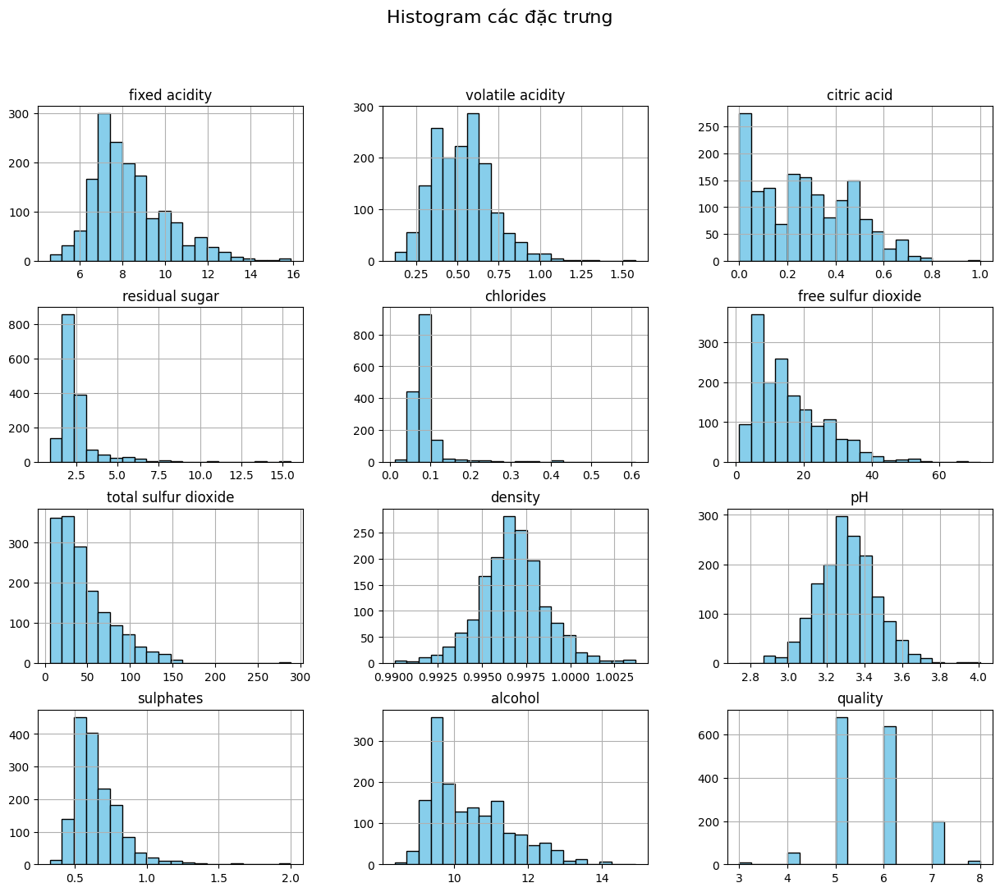

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# --- 3. Trực quan hóa phân phối các đặc trưng ---
df.hist(bins=20, figsize=(15, 12), color="skyblue", edgecolor="black")
plt.suptitle("Histogram các đặc trưng", fontsize=16)
plt.show()

/tmp/ipython-input-4103934179.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="quality", y="alcohol", data=df, palette="Set2")


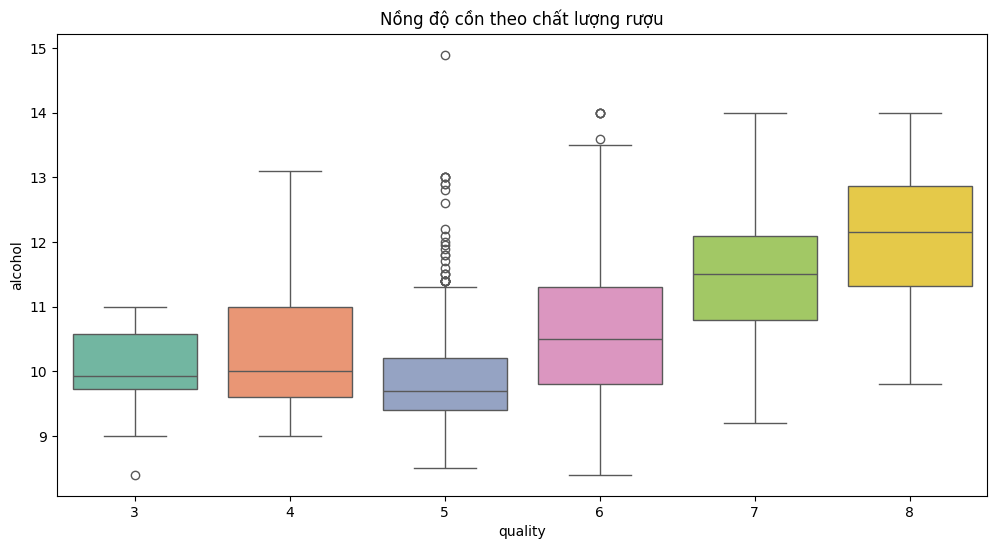

In [ ]:
# --- 4. Boxplot theo chất lượng ---
plt.figure(figsize=(12,6))
sns.boxplot(x="quality", y="alcohol", data=df, palette="Set2")
plt.title("Nồng độ cồn theo chất lượng rượu")
plt.show()

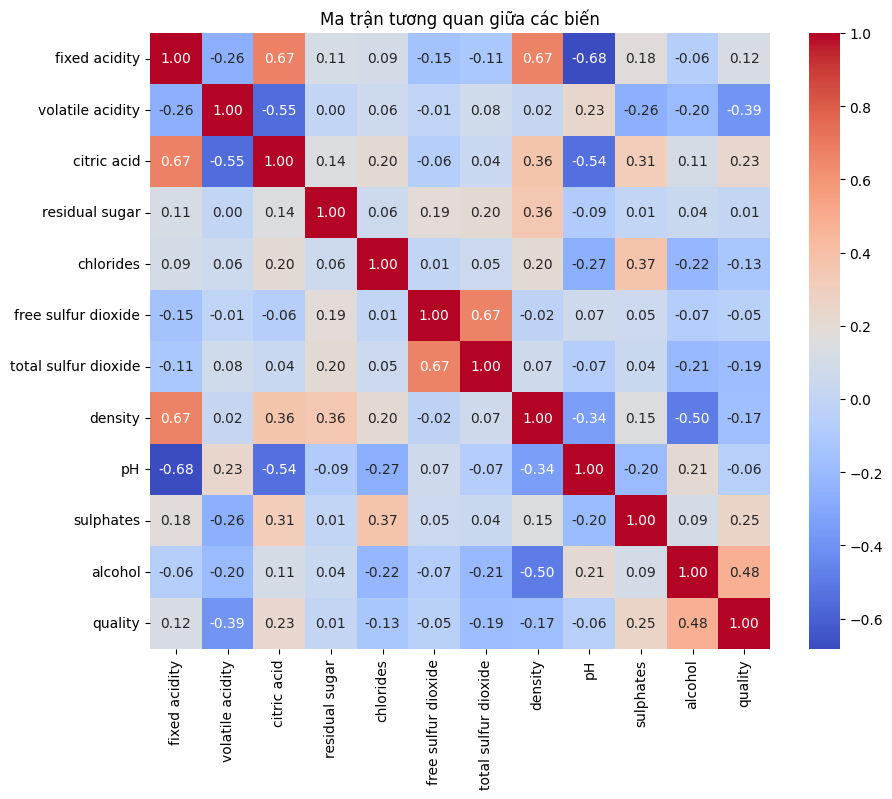

In [ ]:
# --- 5. Biểu đồ Heatmap tương quan ---
plt.figure(figsize=(10,8))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Ma trận tương quan giữa các biến")
plt.show()

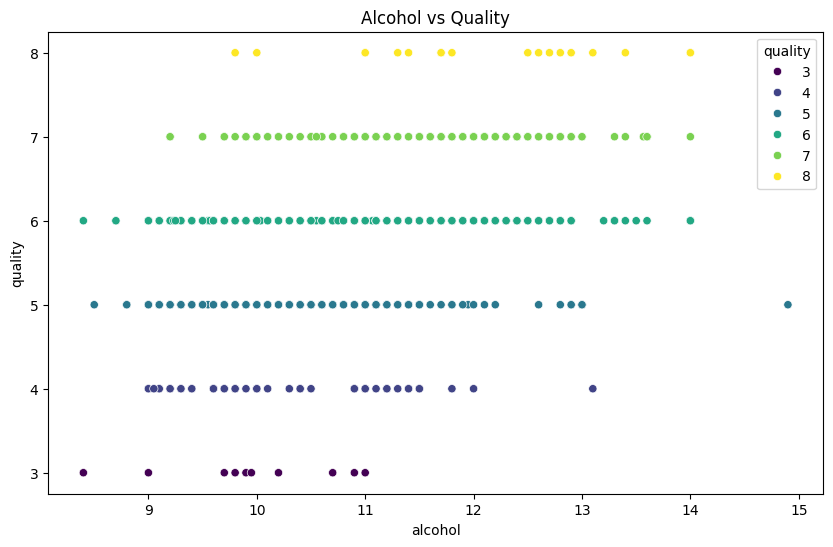

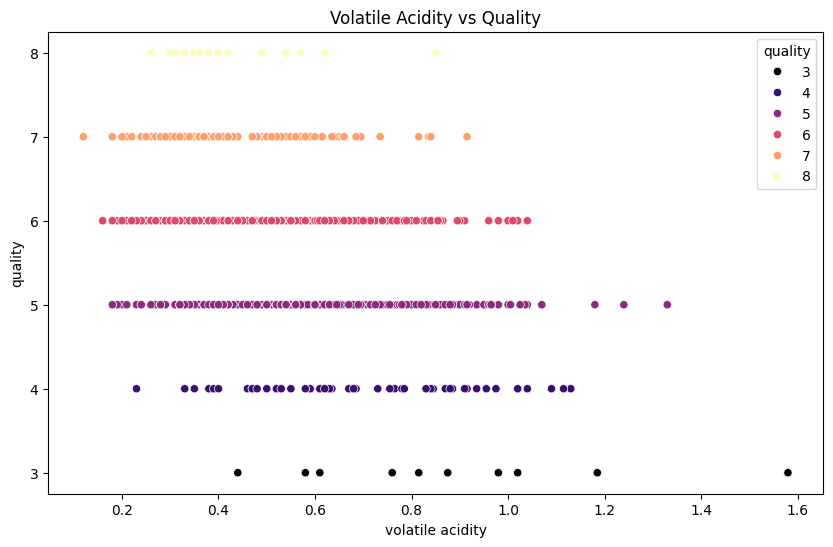

In [ ]:
# --- 6. Scatterplot một số đặc trưng so với chất lượng ---
plt.figure(figsize=(10,6))
sns.scatterplot(x="alcohol", y="quality", data=df, hue="quality", palette="viridis")
plt.title("Alcohol vs Quality")
plt.show()

plt.figure(figsize=(10,6))
sns.scatterplot(x="volatile acidity", y="quality", data=df, hue="quality", palette="magma")
plt.title("Volatile Acidity vs Quality")
plt.show()

## Bài 2_1: Thực hiện trực quan hóa dữ liệu trên tập dữ liệu về bệnh tiểu đường.
Dữ liệu lấy tại:
https://www.kaggle.com/code/vincentlugat/pima-indians-diabetes-eda-prediction-0-906

### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


Bệnh tiểu đường xảy ra khi lượng đường trong máu (glucose máu) cao bất thường. Bộ dữ liệu này có mục tiêu hỗ trợ chẩn đoán bệnh tiểu đường dựa trên một số chỉ số y khoa được thu thập. Một số điều kiện được áp dụng trong quá trình chọn mẫu: tất cả bệnh nhân đều là nữ, từ 21 tuổi trở lên, thuộc dân tộc Pima.


#### 1.2. Mô tả các biến


1. pregnancies -> số lần một người phụ nữ từng mang thai.
2. glucose -> chỉ số đường huyết được đo 2 giờ sau khi bệnh nhân uống 75g dung dịch glucose
3. blood_pressure -> áp lực trong động mạch khi tim giãn ra (là số dưới trong chỉ số huyết áp, ví dụ 120/80).
4. skin_thickness -> một phương pháp đo lượng mỡ dự trữ trong cơ thể
5. insulin -> lượng insulin trong máu được đo cùng thời điểm với chỉ số đường huyết sau 2 giờ.
6. bmi -> chỉ số khối cơ thể
7. dpf -> chỉ số lượng hóa tiền sử gia đình mắc bệnh tiểu đường.
8. age -> Tuổi của một người tại thời điểm khảo sát.
9. outcome -> kết quả chẩn đoán mà mô hình máy học cần dự đoán (0 – Âm tính với bệnh tiểu đường; 1 – Dương tính với bệnh tiểu đường)

### **2. THỰC HÀNH**


#### 2.1 Chuẩn bị dữ liệu cho trực quan hóa dữ liệu, trực quan hóa dữ liệu với thư viện Matplotlib và Seaborn


##### Import thư viện và dataset để làm việc

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
column_names = ["Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DPF","Age","Outcome"]
dibetes_df = pd.read_csv('/content/pima-indians-diabetes.data.csv',names=column_names)

##### Quan sát dữ liệu



In [ ]:
dibetes_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
dibetes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Pregnancies    768 non-null    int64  
 1   Glucose        768 non-null    int64  
 2   BloodPressure  768 non-null    int64  
 3   SkinThickness  768 non-null    int64  
 4   Insulin        768 non-null    int64  
 5   BMI            768 non-null    float64
 6   DPF            768 non-null    float64
 7   Age            768 non-null    int64  
 8   Outcome        768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [ ]:
dibetes_df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [ ]:
dibetes_df.isnull()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,Outcome
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
763,False,False,False,False,False,False,False,False,False
764,False,False,False,False,False,False,False,False,False
765,False,False,False,False,False,False,False,False,False
766,False,False,False,False,False,False,False,False,False


##### Làm sạch dữ liệu trước khi trưc quan hóa dữ liệu

In [ ]:
# Tạo một bản sao của dataframe gốc 'diabetes_df' để làm việc,
# nhằm tránh thay đổi trực tiếp dữ liệu gốc.
data_cp = dibetes_df.copy(deep=True)

# Trong dữ liệu gốc có nhiều cột mà giá trị '0' thực chất không hợp lý (ví dụ: Glucose = 0 hay BMI = 0).
# Vì vậy, ta thay thế tất cả các giá trị 0 trong các cột này bằng NaN (giá trị khuyết).
# Điều này giúp ta dễ dàng xử lý thiếu dữ liệu sau này (bằng imputation, mean, median, ...).
data_cp[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] = (
    data_cp[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']]
    .replace(0, np.nan)
)


##### Trực quan hóa dữ liệu

biểu đồ phân phối dữ liệu

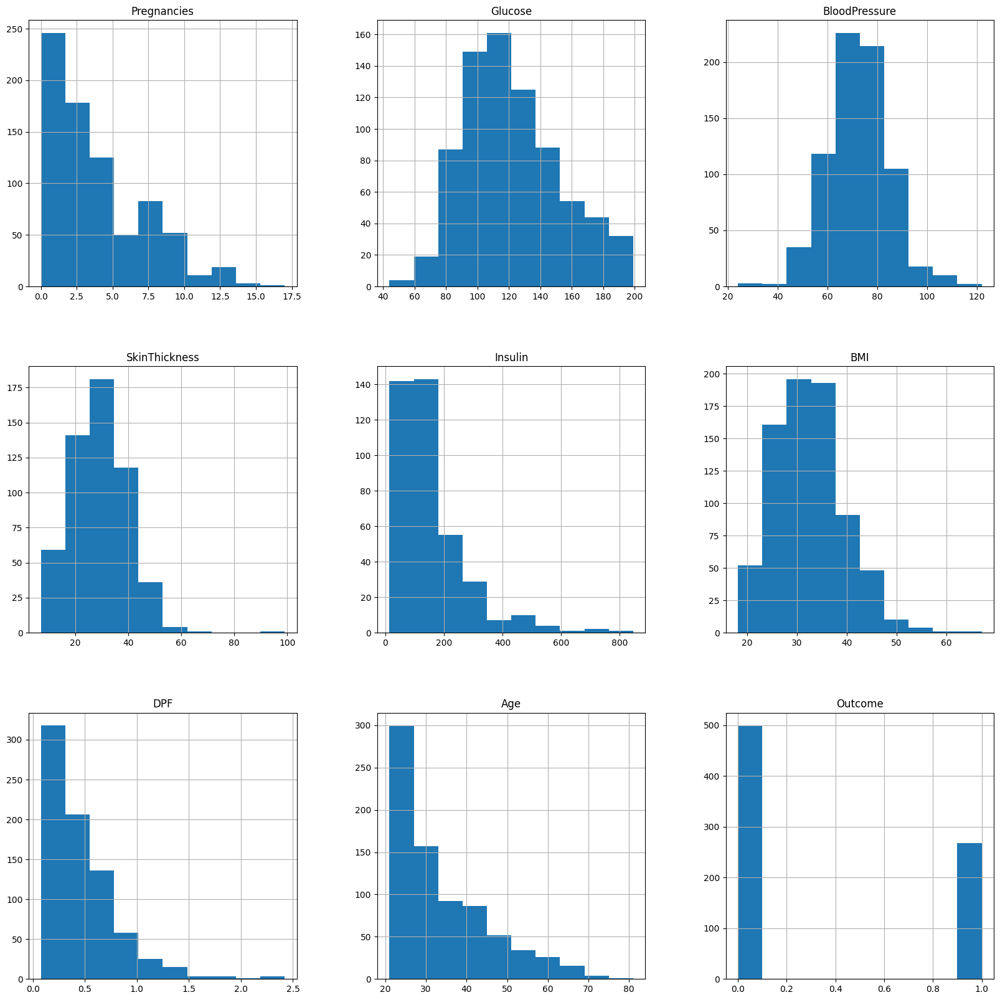

In [ ]:
p = data_cp.hist(figsize=(20,20))

Xử lý các giá trị thiếu bằng cách điền trung bình (mean) cho các biến Glucose, BloodPressure và trung vị (median) cho các biến SkinThickness, Insulin, BMI.

In [ ]:
data_cp.fillna({
    # Với cột 'Glucose': thay thế các giá trị NaN bằng giá trị trung bình (mean) của cột
    'Glucose': data_cp['Glucose'].mean(),

    # Với cột 'BloodPressure': thay thế NaN bằng trung bình (mean)
    'BloodPressure': data_cp['BloodPressure'].mean(),

    # Với cột 'SkinThickness': thay thế NaN bằng trung vị (median)
    'SkinThickness': data_cp['SkinThickness'].median(),

    # Với cột 'Insulin': thay thế NaN bằng trung vị (median)
    'Insulin': data_cp['Insulin'].median(),

    # Với cột 'BMI': thay thế NaN bằng trung vị (median)
    'BMI': data_cp['BMI'].median()
}, inplace=True)


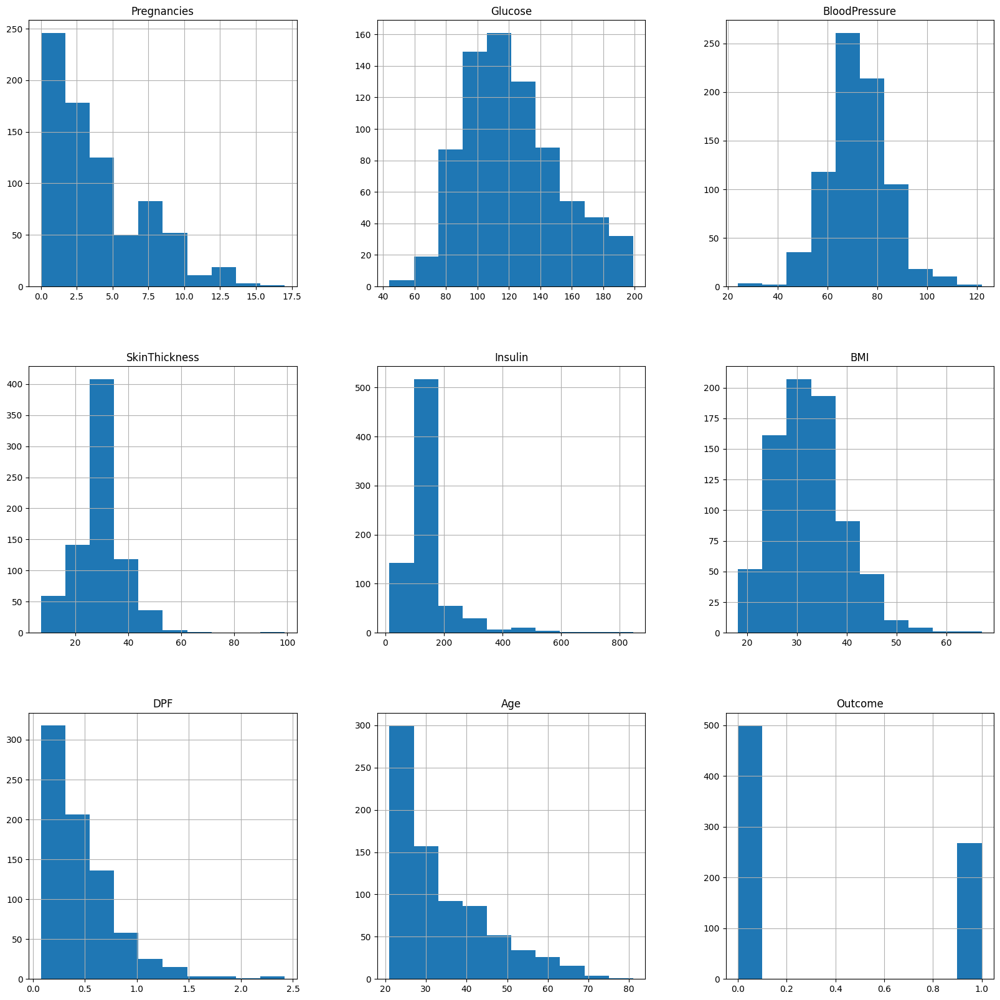

In [ ]:
#Biểu đồ phân phối dữ liệu sau khi loại bỏ các giá trị NaN
p = data_cp.hist(figsize=(20,20))

Kiểm tra và trực quan hóa phân bố biến Outcome

Outcome
0    500
1    268
Name: count, dtype: int64


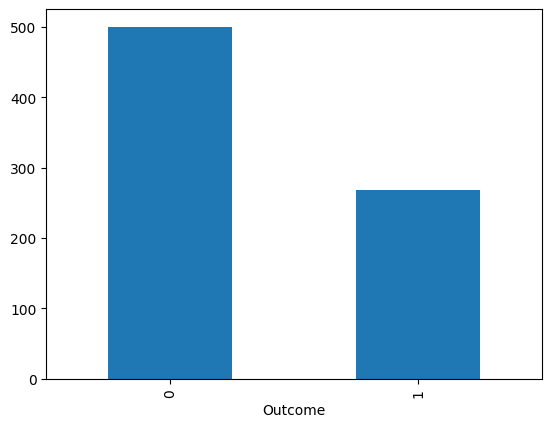

In [ ]:
print(data_cp['Outcome'].value_counts())

# Vẽ biểu đồ cột (bar chart) để trực quan hóa tần suất phân bố của nhãn 'Outcome'.
p = data_cp['Outcome'].value_counts().plot(kind="bar")

Phân tích đa biến
Biểu đồ trên cho thấy dữ liệu bị lệch về phía các điểm dữ liệu có giá trị kết quả là 0. Số người không mắc bệnh tiểu đường gần gấp đôi số bệnh nhân tiểu đường.

Biểu đồ cho thấy mối quan hệ giữa tất cả các biến liên tục trong dataset và phân biệt nhóm Outcome (0 = không tiểu đường, 1 = có tiểu đường).

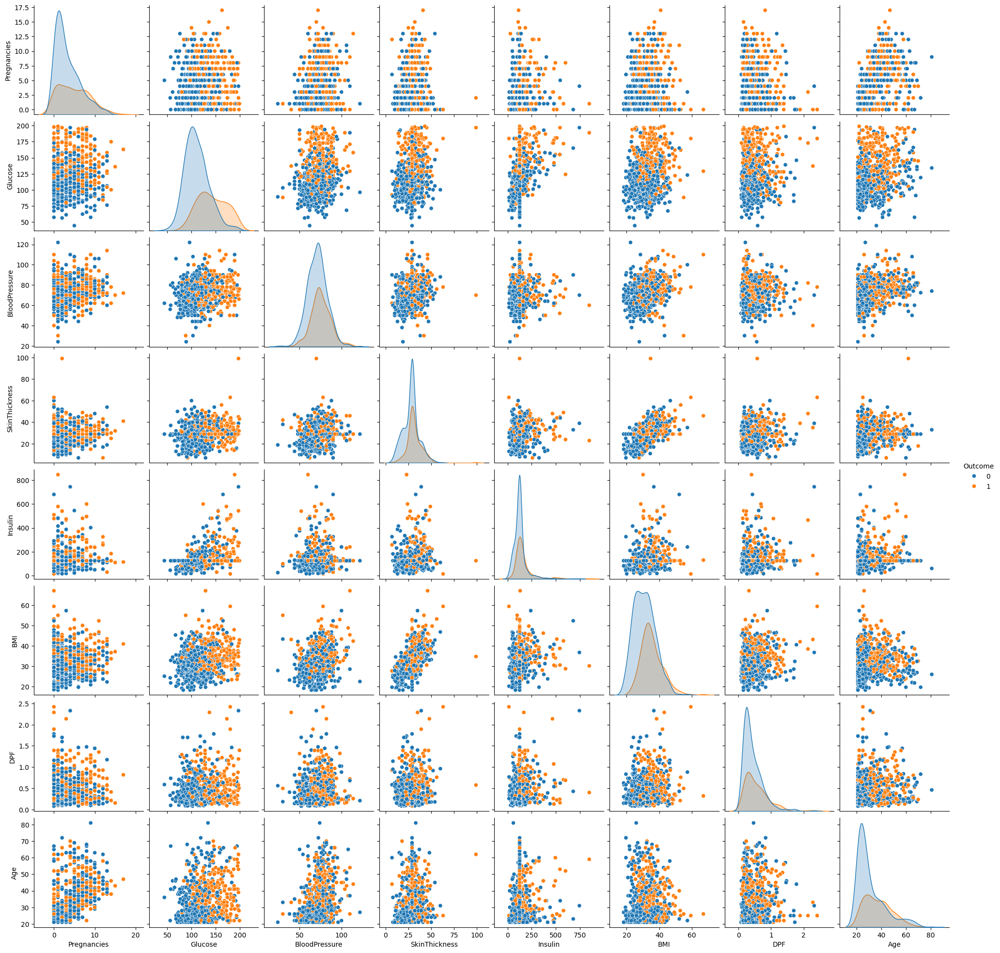

In [ ]:
# Vẽ biểu đồ pairplot (biểu đồ cặp) bằng seaborn
# Mỗi biến (cột) trong data_cp sẽ được kết hợp 2 cặp để vẽ scatterplot,
# và đường chéo chính (diagonal) sẽ hiển thị histogram/phân phối của từng biến.
# Tham số hue="Outcome" giúp tô màu các điểm dữ liệu theo nhãn Outcome (0 hoặc 1).
p = sns.pairplot(data_cp, hue="Outcome")

Sự tương quan giữa tất cả feature

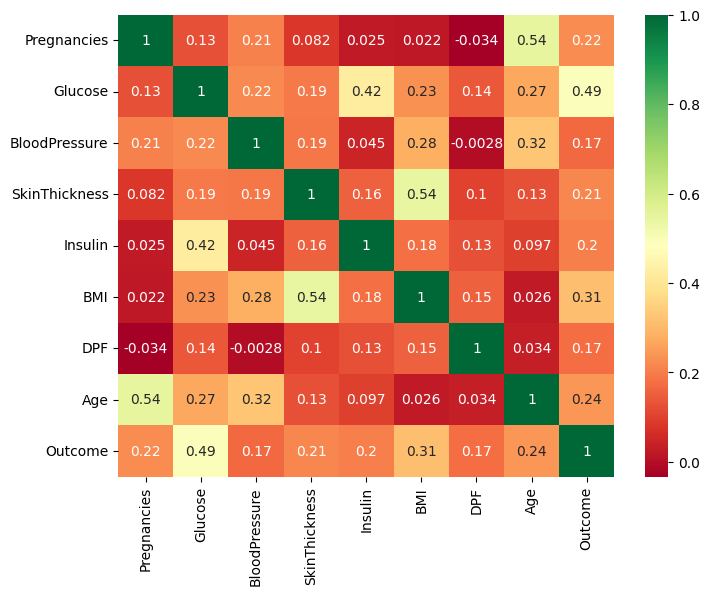

In [ ]:
# Tạo một figure mới với kích thước 8x6 inch để biểu đồ dễ nhìn
plt.figure(figsize=(8,6))

# Vẽ bản đồ nhiệt (heatmap) của ma trận tương quan giữa các biến số trong dataset 'data'
# - data.corr(): tính hệ số tương quan (Pearson) giữa các cột số học trong DataFrame
# - annot=True: hiển thị giá trị số tương quan ngay trong từng ô
# - cmap='RdYlGn': chọn bảng màu (đỏ - vàng - xanh), đỏ = tương quan âm mạnh, xanh = tương quan dương mạnh
p = sns.heatmap(data_cp.corr(), annot=True, cmap='RdYlGn')

Vẽ biểu đồ tỷ lệ mắc bệnh theo nhóm tuổi

/tmp/ipython-input-1275642678.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data_cp.groupby("age_group")["Outcome"]


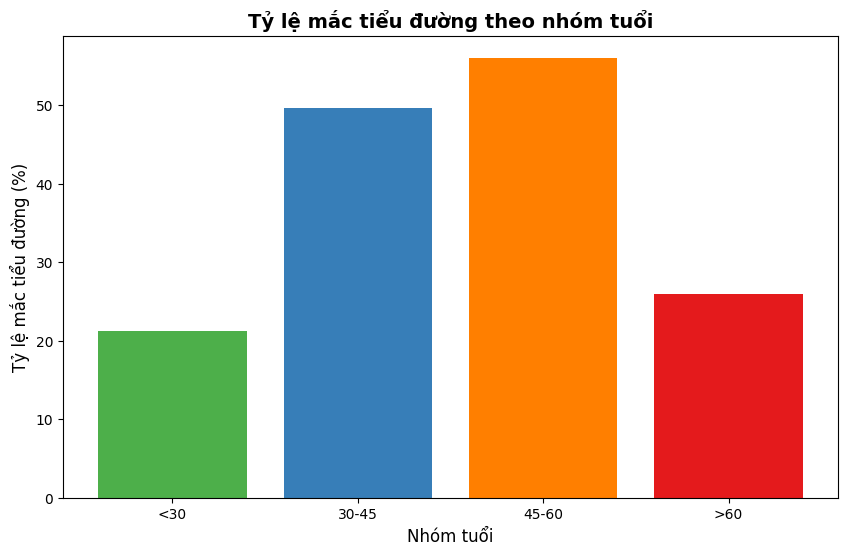

In [ ]:
# Chia nhóm tuổi
bins   = [0, 29, 45, 60, 100]
labels = ["<30", "30-45", "45-60", ">60"]
data_cp["age_group"] = pd.cut(data_cp["Age"], bins=bins, labels=labels)

# Tính tỷ lệ dương tính (Outcome=1) theo nhóm tuổi
age_group_stats = (
    data_cp.groupby("age_group")["Outcome"]
    .mean()
    .mul(100)  # đổi sang %
    .reset_index(name="positive_rate")
)

# Vẽ biểu đồ
plt.figure(figsize=(10,6))
colors = ["#4daf4a", "#377eb8", "#ff7f00", "#e41a1c"]
plt.bar(age_group_stats["age_group"], age_group_stats["positive_rate"], color=colors)
plt.xlabel("Nhóm tuổi", fontsize=12)
plt.ylabel("Tỷ lệ mắc tiểu đường (%)", fontsize=12)
plt.title("Tỷ lệ mắc tiểu đường theo nhóm tuổi", fontsize=14, weight="bold")
plt.show()



Vẽ biểu đồ tỷ lệ mắc bệnh, không mắc theo nhóm tuổi

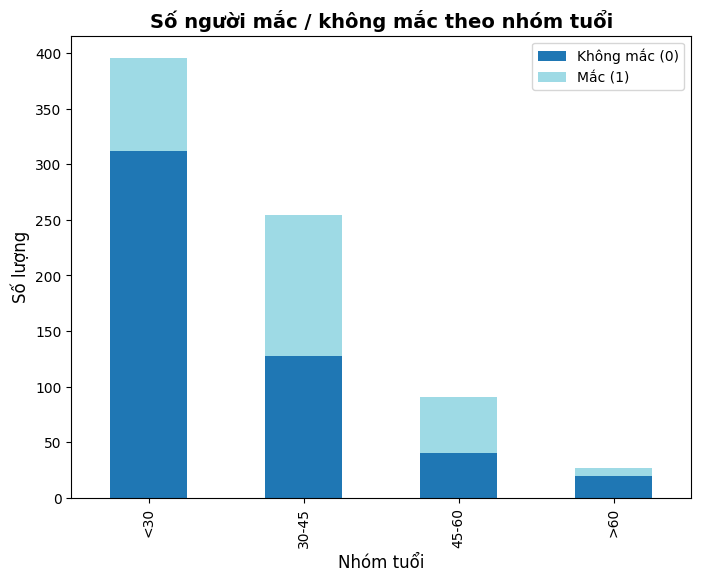

In [ ]:
# Đếm số lượng người theo từng nhóm tuổi và phân loại (class = 0: không mắc, 1: mắc)
age_group_counts = (
    data_cp.groupby(["age_group","Outcome"], observed=True)
    .size()                          # đếm số lượng
    .unstack(fill_value=0)           # chuyển class thành cột, điền 0 nếu thiếu
)
# Vẽ biểu đồ cột chồng (stacked bar chart)
age_group_counts.plot(
    kind="bar", stacked=True, figsize=(8,6), colormap="tab20"
)
# Trang trí biểu đồ
plt.xlabel("Nhóm tuổi", fontsize=12)
plt.ylabel("Số lượng", fontsize=12)
plt.title("Số người mắc / không mắc theo nhóm tuổi", fontsize=14, weight="bold")
plt.legend(["Không mắc (0)", "Mắc (1)"])
plt.show()


Vẽ biểu đồ Phân bố Glucose ở nhóm <30 theo tình trạng bệnh và Phân bố BMI ở nhóm <30 theo tình trạng bệnh

/tmp/ipython-input-3412937845.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3412937845.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


Text(0.5, 1.0, 'Phân bố BMI ở nhóm <30 theo tình trạng bệnh')

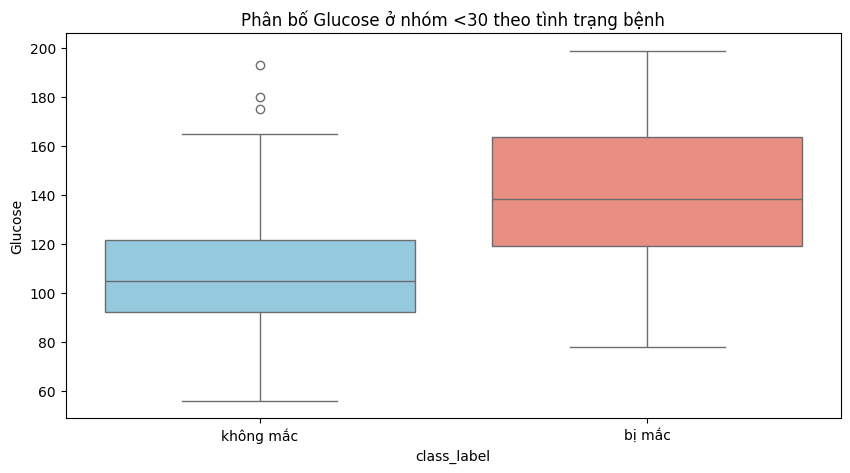

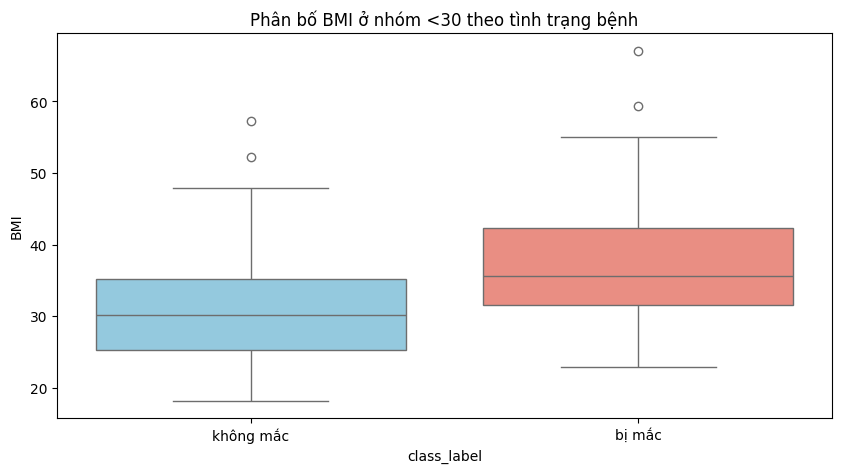

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lọc dữ liệu cho nhóm tuổi <30
group_less_30 = data_cp[data_cp["age_group"] == "<30"].copy()

# Tạo cột 'class_label' để hiển thị nhãn dễ hiểu (0 -> "không mắc", 1 -> "bị mắc")
group_less_30["class_label"] = group_less_30["Outcome"].map({0: "không mắc", 1: "bị mắc"})

# Biểu đồ boxplot phân bố Glucose theo tình trạng bệnh trong nhóm <30
plt.figure(figsize=(10,5))
sns.boxplot(
    x="class_label",
    y="Glucose",
    data=group_less_30,
    palette={"không mắc": "skyblue", "bị mắc": "salmon"}  # màu riêng cho từng nhóm
)
plt.title("Phân bố Glucose ở nhóm <30 theo tình trạng bệnh")

# Biểu đồ boxplot phân bố BMI theo tình trạng bệnh trong nhóm <30
plt.figure(figsize=(10,5))
sns.boxplot(
    x="class_label",
    y="BMI",
    data=group_less_30,
    palette={"không mắc": "skyblue", "bị mắc": "salmon"}
)
plt.title("Phân bố BMI ở nhóm <30 theo tình trạng bệnh")

Vẽ biểu đồ tỷ lệ mắc tiểu đường và số người mắc / không mắc theo nhóm BMI

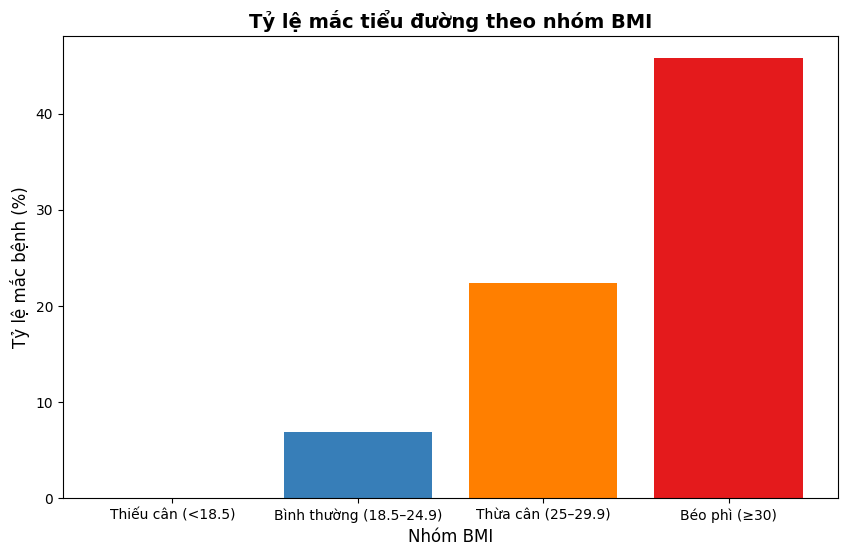

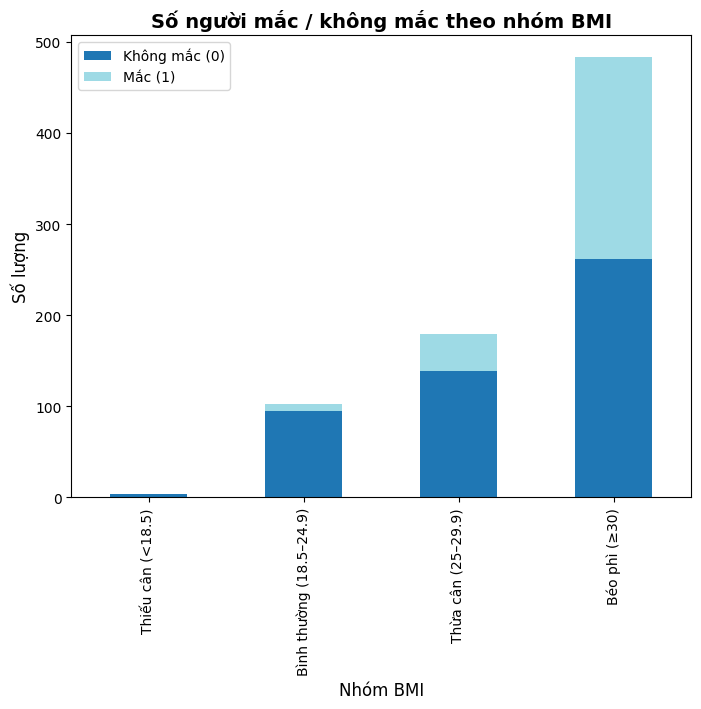

In [ ]:
# Chia nhóm
bmi_bins = [0, 18.5, 24.9, 29.9, 100]
bmi_labels = ["Thiếu cân (<18.5)", "Bình thường (18.5–24.9)", "Thừa cân (25–29.9)", "Béo phì (≥30)"]

data_cp["bmi_group"] = pd.cut(data_cp["BMI"], bins=bmi_bins, labels=bmi_labels, right=True)

bmi_group_stats = data_cp.groupby("bmi_group", observed=True)["Outcome"].agg(
    total="count",
    positive="sum"
)
bmi_group_stats["positive_rate"] = (bmi_group_stats["positive"] / bmi_group_stats["total"]) * 100
# Biểu đồ tỷ lệ mắc bệnh theo nhóm BMI
plt.figure(figsize=(10,6))
plt.bar(
    bmi_group_stats.index,                  # Nhóm BMI (labels trên trục x)
    bmi_group_stats["positive_rate"],       # Tỷ lệ mắc bệnh (%) theo từng nhóm
    color=["#4daf4a","#377eb8","#ff7f00","#e41a1c"]  # Màu cho từng nhóm
)
plt.xlabel("Nhóm BMI", fontsize=12)
plt.ylabel("Tỷ lệ mắc bệnh (%)", fontsize=12)
plt.title("Tỷ lệ mắc tiểu đường theo nhóm BMI", fontsize=14, weight="bold")
plt.show()

# Đếm số lượng người mắc và không mắc theo nhóm BMI
bmi_group_counts = (
    data_cp.groupby(["bmi_group","Outcome"], observed=True)
    .size()                  # đếm số lượng từng nhóm
    .unstack(fill_value=0)   # chuyển class thành cột, điền 0 nếu thiếu
)

# Biểu đồ stacked bar thể hiện số lượng theo nhóm BMI
bmi_group_counts.plot(
    kind="bar", stacked=True, figsize=(8,6), colormap="tab20"
)
plt.xlabel("Nhóm BMI", fontsize=12)
plt.ylabel("Số lượng", fontsize=12)
plt.title("Số người mắc / không mắc theo nhóm BMI", fontsize=14, weight="bold")
plt.legend(["Không mắc (0)", "Mắc (1)"])
plt.show()

Vẽ biểu đồ phân bố Diabetes Pedigree Function (DPF) trong nhóm BMI bình thường

/tmp/ipython-input-1522012624.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


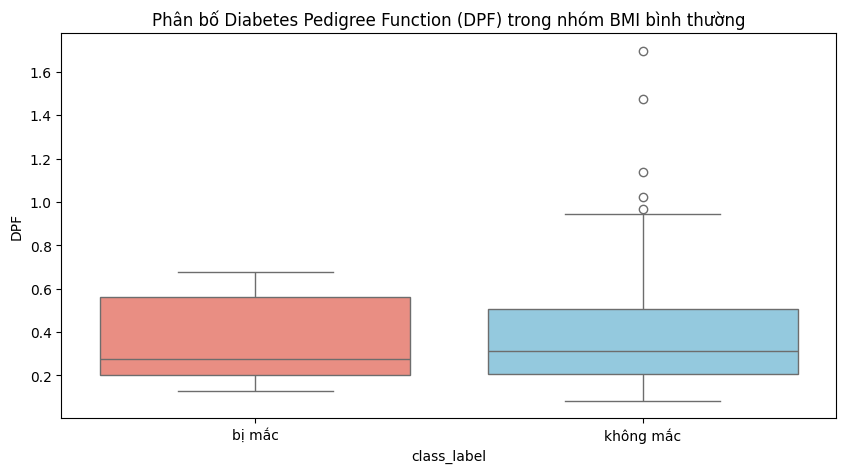

In [ ]:
# Lọc dữ liệu cho nhóm có BMI "Bình thường (18.5–24.9)"
group_normal = data_cp[data_cp["bmi_group"] == "Bình thường (18.5–24.9)"].copy()

# Tạo cột nhãn dễ hiểu cho tình trạng bệnh: 0 -> "không mắc", 1 -> "bị mắc"
group_normal["class_label"] = group_normal["Outcome"].map({0: "không mắc", 1: "bị mắc"})

# Vẽ boxplot phân bố chỉ số DPF (Diabetes Pedigree Function) theo tình trạng bệnh
plt.figure(figsize=(10,5))
sns.boxplot(
    x="class_label",   # trục x: tình trạng bệnh (không mắc / bị mắc)
    y="DPF",           # trục y: giá trị DPF
    data=group_normal,
    palette={"không mắc": "skyblue", "bị mắc": "salmon"}  # màu cho từng nhóm
)
plt.title("Phân bố Diabetes Pedigree Function (DPF) trong nhóm BMI bình thường")
plt.show()

## Bài 2_2: Thực hiện EDA trên tập dữ liệu mua sắm tại siêu thị.
Tập dữ liệu lấy từ:
https://www.kaggle.com/code/rajatkumar30/eda-online-retail

### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


<!-- Mô tả sơ vấn đề bài toán -->

Đây là dữ liệu từ một cửa hàng bán lẻ trực tuyến (Online Retail), lưu lại tất cả các giao dịch mua hàng của khách.

Mục tiêu có thể là:

- Phân tích hành vi mua sắm của khách hàng.

- Xác định sản phẩm bán chạy.

- Tìm thời điểm mua sắm cao điểm.

- Hỗ trợ các bài toán Customer Segmentation, Market Basket Analysis, Doanh thu theo thời gian, v.v.

#### 1.2. Mô tả các biến


<!-- Giải thích sơ các biến -->
- `InvoiceNo` → mã số hóa đơn, định danh duy nhất cho mỗi giao dịch.  
- `StockCode` → mã sản phẩm (code riêng cho từng mặt hàng).  
- `Description` → tên/mô tả chi tiết sản phẩm.  
- `Quantity` → số lượng sản phẩm được mua trong hóa đơn.  
- `InvoiceDate` → ngày và giờ phát sinh giao dịch.  
- `UnitPrice` → giá bán của **một đơn vị sản phẩm** (tính bằng bảng Anh £).  
- `CustomerID` → mã khách hàng (ẩn danh, định danh người mua).  
- `Country` → quốc gia nơi khách hàng thực hiện giao dịch.  

**👉 Nhận xét:**  
- Dataset lưu trữ chi tiết giao dịch **thương mại điện tử** của một siêu thị online.  
- Mỗi dòng dữ liệu là **một sản phẩm trong một hóa đơn**.  
- Có thể tính thêm chỉ số `TotalAmount = Quantity × UnitPrice` để phân tích doanh thu.  
- Các thuộc tính cho phép phân tích:  
  - **Theo thời gian** (tháng, ngày trong tuần)  
  - **Theo khách hàng** (CustomerID)  
  - **Theo quốc gia** (Country)  
  - **Theo sản phẩm** (Description, StockCode).  


### **2. THỰC HÀNH**


#### 2.1 Chuẩn bị dữ liệu cho trực quan hóa dữ liệu, trực quan hóa dữ liệu với thư viện Matplotlib và Seaborn


##### Import thư viện và dataset để làm việc

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
online_retail_df = pd.read_csv("/content/Online Retail.csv")

##### Quan sát dữ liệu

In [ ]:
online_retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [ ]:
online_retail_df.shape

(541909, 8)

In [ ]:
online_retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [ ]:
online_retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [ ]:
online_retail_df['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Bahrain', 'Greece', 'Hong Kong', 'Singapore',
       'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Unspecified', 'Brazil', 'USA',
       'European Community', 'Malta', 'RSA'], dtype=object)

In [ ]:
online_retail_df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,1454
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,135080
Country,0


Tạo cột TotalAmount để dễ dàng thống kê và trực quan hơn

In [ ]:
online_retail_df['TotalAmount'] = online_retail_df['Quantity'] * online_retail_df['UnitPrice']
online_retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalAmount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34


- `online_retail_df['Quantity'] * online_retail_df['UnitPrice']` → tính tổng tiền cho từng dòng giao dịch (số lượng × đơn giá).  
- `online_retail_df['TotalAmount'] = ...` → tạo thêm cột mới `TotalAmount` để lưu kết quả tính toán.  
- `online_retail_df.head()` → hiển thị 5 dòng đầu tiên của DataFrame để kiểm tra dữ liệu sau khi thêm cột.  

**👉 Nhận xét:**  
- Sau bước này, DataFrame có thêm cột `TotalAmount`.  
- Đây là chỉ số quan trọng để phân tích doanh thu theo hóa đơn, khách hàng, hay quốc gia.  


##### Làm sạch dữ liệu trước khi trưc quan hóa dữ liệu

- Remove duplicate rows
- Handling missing values
- Convert columns to approriate datatypes

In [ ]:
online_retail_df['CustomerID'] = online_retail_df['CustomerID'].fillna("Unknown")
online_retail_df.dropna(subset=['Description'],inplace=True)
online_retail_df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0
TotalAmount,0


- `online_retail_df['CustomerID'].fillna("Unknown")` → thay giá trị thiếu trong `CustomerID` bằng `"Unknown"`.  
- `online_retail_df.dropna(subset=['Description'], inplace=True)` → xóa các dòng bị thiếu thông tin mô tả sản phẩm (`Description`).  
- `online_retail_df.isnull().sum()` → đếm số giá trị thiếu còn lại trong từng cột.  

**👉 Nhận xét:**  
- Sau bước này, cột `CustomerID` không còn NaN (gán thành `"Unknown"`).  
- Các dòng thiếu mô tả sản phẩm đã bị loại bỏ.  
- DataFrame sạch hơn, sẵn sàng cho phân tích tiếp theo.  


In [ ]:
columns_drop = ['InvoiceNo','StockCode']
online_retail_df_cleaned = online_retail_df.drop(columns=columns_drop)
online_retail_df_cleaned.head()

,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalAmount
0,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34


- `columns_drop = ['InvoiceNo','StockCode']` → xác định danh sách các cột cần loại bỏ.  
- `online_retail_df.drop(columns=columns_drop)` → xóa các cột không cần thiết khỏi DataFrame.  
- `online_retail_df_cleaned.head()` → xem 5 dòng đầu tiên của DataFrame sau khi đã loại bỏ cột.  

**👉 Nhận xét:**  
- Dataset gọn hơn, chỉ giữ lại các cột quan trọng cho phân tích.  


In [ ]:
median = online_retail_df_cleaned.median(numeric_only=True)
median

,0
Quantity,3.00
UnitPrice,2.08
TotalAmount,9.84


- `online_retail_df_cleaned.median(numeric_only=True)` → tính **trung vị (median)** cho tất cả các cột số.  
- `median` → hiển thị kết quả trung vị của từng cột.  

**👉 Nhận xét:**  
- Trung vị giúp mô tả xu hướng trung tâm của dữ liệu, ít bị ảnh hưởng bởi giá trị ngoại lai hơn so với mean.  


In [ ]:
online_retail_df_cleaned['InvoiceDate'] = pd.to_datetime(
    online_retail_df_cleaned['InvoiceDate'], errors='coerce'
)

online_retail_df_cleaned['MonthYear']=online_retail_df_cleaned['InvoiceDate'].dt.to_period('M')
online_retail_df_cleaned.head()

,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalAmount,MonthYear
0,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12
1,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12
2,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12
3,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12
4,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12


- `pd.to_datetime(..., errors='coerce')` → chuyển cột `InvoiceDate` sang kiểu **datetime**; nếu lỗi thì gán `NaT`.  
- `.dt.to_period('M')` → tạo thêm cột `MonthYear`, biểu diễn thời gian ở mức **tháng-năm**.  
- `head()` → kiểm tra vài dòng đầu sau khi thêm cột mới.  

**👉 Nhận xét:**  
- Giúp chuẩn hóa dữ liệu ngày tháng.  
- Có thể dễ dàng phân tích doanh thu theo từng **tháng/năm**.  


In [ ]:
online_retail_df_cleaned['Year']=online_retail_df_cleaned['InvoiceDate'].dt.year

- `.dt.year` → trích xuất **năm** từ cột `InvoiceDate`.  
- Gán vào cột mới `Year` để lưu thông tin năm cho từng giao dịch.  

**👉 Nhận xét:**  
- Bổ sung thêm chiều thời gian theo **năm**, hữu ích cho phân tích xu hướng doanh thu qua các năm.  


##### EDA

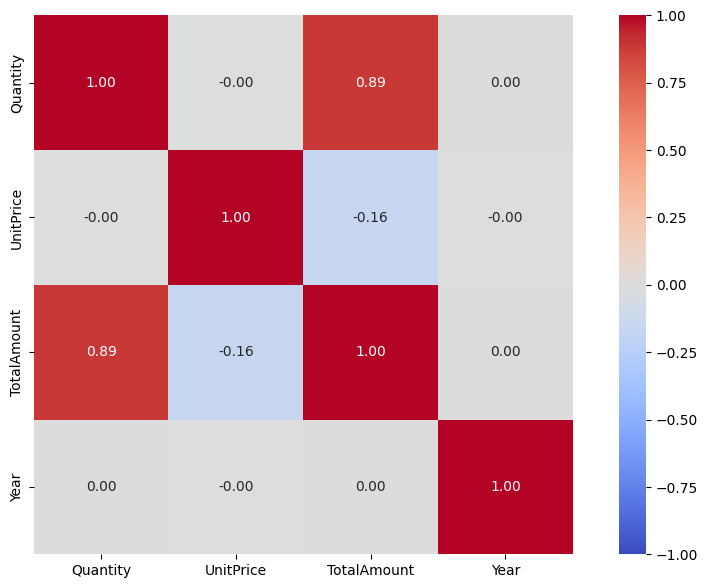

In [ ]:
# Tính ma trận tương quan cho các cột số
corrmat = online_retail_df_cleaned.corr(numeric_only=True)

# Tạo figure với kích thước 12x7 inch
f, ax = plt.subplots(figsize=(12,7))

# Vẽ heatmap:
# - data=corrmat: dữ liệu tương quan
# - annot=True: hiển thị giá trị số trong từng ô
# - vmin=-1, vmax=1: giới hạn giá trị từ -1 đến 1
# - fmt=".2f": định dạng số thập phân 2 chữ số
# - square=True: ô vuông
# - cmap="coolwarm": thang màu xanh–đỏ
sns.heatmap(data=corrmat, annot=True, vmin=-1, vmax=1, fmt=".2f", square=True, cmap="coolwarm")

plt.show()


- `corr(numeric_only=True)` → tính hệ số tương quan Pearson giữa các cột số.  
- `plt.subplots(figsize=(12,7))` → tạo khung hình để vẽ biểu đồ.  
- `sns.heatmap(..., annot=True)` → vẽ bản đồ nhiệt, hiển thị giá trị tương quan trong từng ô.  
- `vmin=-1, vmax=1` → giới hạn giá trị trong khoảng -1 đến 1.  
- `fmt=".2f"` → hiển thị số với 2 chữ số thập phân.  
- `cmap="coolwarm"` → màu xanh biểu thị tương quan âm, đỏ biểu thị tương quan dương.  

**👉 Nhận xét:**  
- Heatmap giúp nhận diện cặp biến nào tương quan mạnh.  
- Ví dụ: `Quantity` và `TotalAmount` thường có tương quan dương cao.  


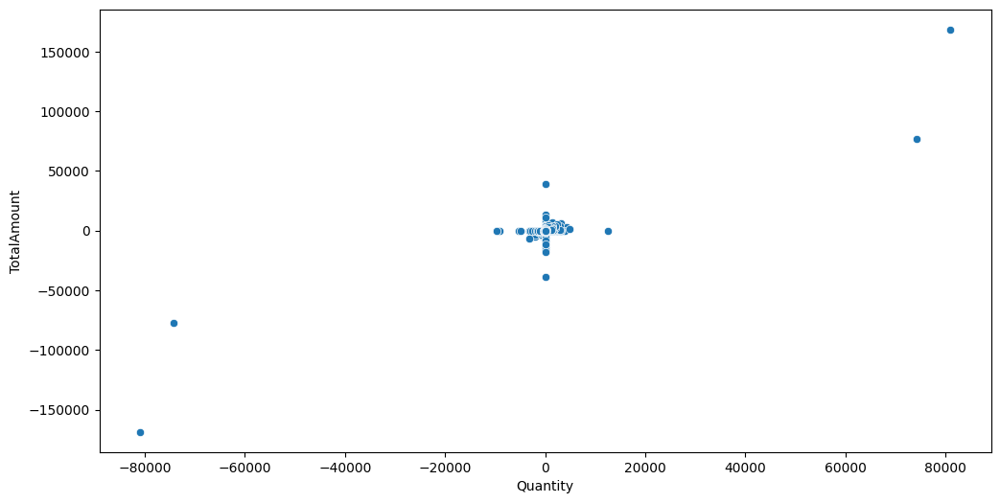

In [ ]:
# Tạo figure kích thước 12x6 inch
plt.figure(figsize=(12,6))

# Vẽ scatterplot (biểu đồ phân tán):
# - x = 'Quantity': số lượng sản phẩm
# - y = 'TotalAmount': tổng số tiền (Quantity × UnitPrice)
# - data = online_retail_df_cleaned: nguồn dữ liệu
sns.scatterplot(y='TotalAmount', x='Quantity', data=online_retail_df_cleaned)

# Hiển thị biểu đồ
plt.show()

- `plt.figure(figsize=(12,6))` → tạo khung hình rộng để biểu đồ dễ quan sát.  
- `sns.scatterplot(x='Quantity', y='TotalAmount')` → vẽ biểu đồ phân tán giữa số lượng và tổng tiền.  
- `plt.show()` → hiển thị biểu đồ.  

**👉 Nhận xét:**  
- Có mối quan hệ tuyến tính rõ ràng: khi **Quantity** tăng, **TotalAmount** cũng tăng.  
- Một số điểm ngoại lai (outliers) xuất hiện khi Quantity rất lớn, có thể cần xử lý trước khi phân tích sâu hơn.  

->Giá trị Quantity âm -> khi nhân ra TotalAmount = Quantity * UnitPrice, dữ liệu sẽ có các giá trị âm cực lớn hoặc dương cực lớn → làm scatterplot bị méo.

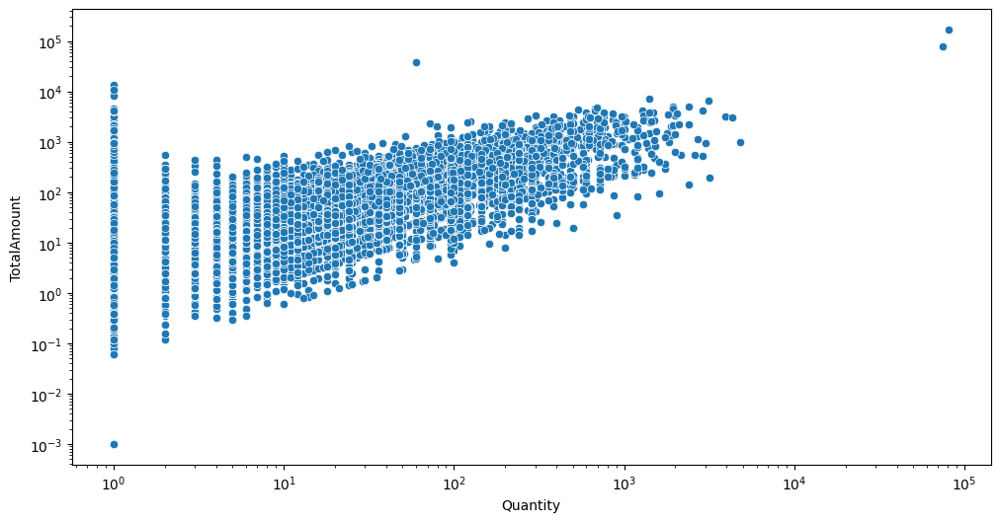

In [ ]:
# Lọc bỏ các giao dịch có Quantity <= 0
online_retail_df_cleaned = online_retail_df_cleaned[online_retail_df_cleaned['Quantity'] > 0]

# Tạo figure kích thước 12x6
plt.figure(figsize=(12,6))

# Vẽ scatterplot giữa Quantity và TotalAmount
sns.scatterplot(
    x='Quantity',
    y='TotalAmount',
    data=online_retail_df_cleaned
)

# Dùng log scale để dễ quan sát dữ liệu có độ lệch lớn
plt.xscale('log')   # trục x (Quantity) theo thang log
plt.yscale('log')   # trục y (TotalAmount) theo thang log

# Hiển thị biểu đồ
plt.show()

- `online_retail_df_cleaned[online_retail_df_cleaned['Quantity'] > 0]` → loại bỏ giao dịch có số lượng âm hoặc bằng 0.  
- `sns.scatterplot(x='Quantity', y='TotalAmount')` → vẽ biểu đồ phân tán số lượng vs tổng tiền.  
- `plt.xscale('log'), plt.yscale('log')` → áp dụng thang log cho cả 2 trục, giúp nhìn rõ hơn dữ liệu bị lệch/phân tán rộng.  

**👉 Nhận xét:**  
- Sau khi dùng log scale, dữ liệu tập trung và dễ quan sát hơn.  
- Các điểm ngoại lai vẫn còn nhưng ít bị “lấn át” trên biểu đồ.  


#### Những tháng trong năm cùng tổng doanh thu thu được là gì ?

Text(0, 0.5, 'TotalAmount')

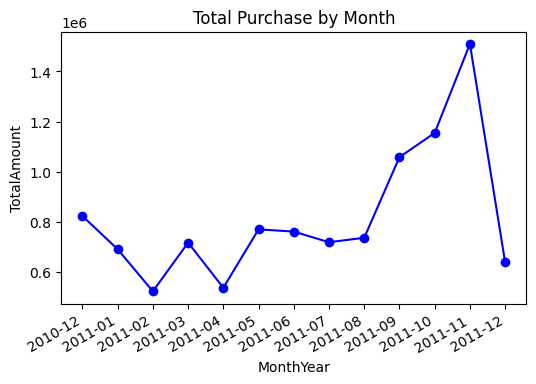

In [ ]:
# Tổng doanh thu theo tháng
monthly_data = online_retail_df_cleaned.groupby('MonthYear')['TotalAmount'].sum().reset_index()

# MonthYear về kiểu chuỗi để vẽ trục x cho gọn
monthly_data['MonthYear'] = monthly_data['MonthYear'].astype(str)

# Khởi tạo figure/axes
fig, ax = plt.subplots(figsize=(6, 4))
fig.autofmt_xdate()  # xoay/format nhãn trục x

# Vẽ line chart
plt.plot(
    monthly_data['MonthYear'],
    monthly_data['TotalAmount'],
    marker='o', linestyle='-', color='b'
)

# Tiêu đề & nhãn trục
plt.title('Total Purchase by Month')
plt.xlabel('MonthYear')
plt.ylabel('TotalAmount')

- `groupby('MonthYear')['TotalAmount'].sum()` → gom dữ liệu theo tháng và tính tổng doanh thu.  
- `astype(str)` → chuyển tháng thành chuỗi để vẽ trục x.  
- `plt.plot(..., marker='o')` → vẽ biểu đồ đường, đánh dấu từng điểm bằng chấm tròn.  
- `fig.autofmt_xdate()` → xoay nhãn trục x cho dễ đọc.  

**👉 Nhận xét:**  
- Doanh thu giảm đầu 2011, thấp nhất tháng **2011-04**.  
- Sau đó tăng mạnh, cao nhất tháng **2011-11 (~1.5 triệu)**.  
- Cuối năm (10–11) là **mùa cao điểm**, doanh thu bùng nổ.  


#### Top 10 quốc gia với tổng doanh thu cao nhất

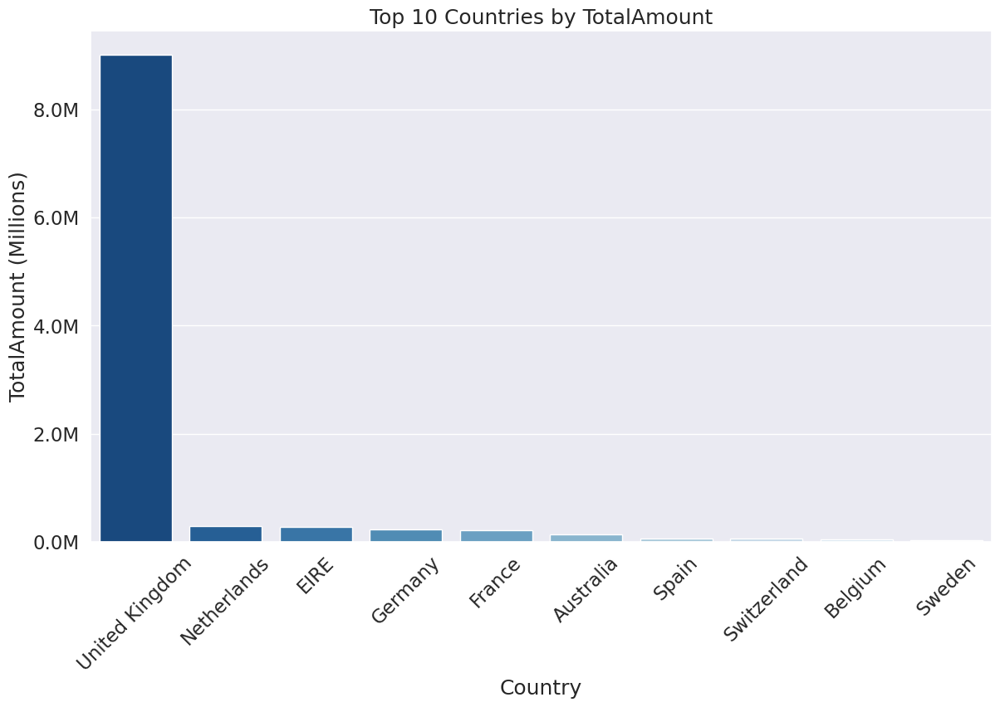

In [ ]:
# Lấy top 10 quốc gia theo tổng doanh thu
top_10_country = (
    online_retail_df_cleaned.groupby('Country')['TotalAmount'].sum()
    .sort_values(ascending=False)
    .head(10)
    .reset_index()
)

# Vẽ barplot
plt.figure(figsize=(14,8))
sns.set(font_scale=1.5)

ax = sns.barplot(
    data=top_10_country,
    x='Country',
    y='TotalAmount',
    palette='Blues_r',
    hue='Country',
    legend=False
)

# Trang trí
ax.set_xlabel('Country')
plt.xticks(rotation=45)
plt.ylabel('TotalAmount (Millions)')
plt.title('Top 10 Countries by TotalAmount')

# Định dạng trục y thành đơn vị triệu (M)
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M'))

- `groupby('Country')['TotalAmount'].sum()` → gom dữ liệu theo quốc gia và tính tổng doanh thu.  
- `sort_values(ascending=False).head(10)` → sắp xếp giảm dần, lấy **10 quốc gia cao nhất**.  
- `sns.barplot(..., palette='Blues_r')` → vẽ biểu đồ cột với màu xanh đảo ngược.  
- `mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M')` → định dạng trục y theo đơn vị triệu (M).  
- `plt.xticks(rotation=45)` → xoay nhãn quốc gia cho dễ đọc.  

**👉 Nhận xét:**  
- **United Kingdom** áp đảo tuyệt đối, doanh thu > **8 triệu**, cao gấp nhiều lần các nước khác.  
- Các quốc gia còn lại (Netherlands, EIRE, Germany, France, …) có doanh thu rất thấp, chỉ vài trăm nghìn.  
- Dataset tập trung chủ yếu ở **UK**, các nước khác đóng góp rất nhỏ.  


In [ ]:
online_retail_df_cleaned.groupby('Country')['TotalAmount'].sum()
#Nhóm tổng doanh thu các quốc gia và thống kê

,TotalAmount
Country,
Australia,138521.310
Austria,10198.680
Bahrain,754.140
Belgium,41196.340
Brazil,1143.600
Canada,3666.380
Channel Islands,20450.440
Cyprus,13590.380
Czech Republic,826.740


### Ngày nào trong 1 tuần là bán chạy nhất ?

Text(37.375, 0.5, 'Total amount')

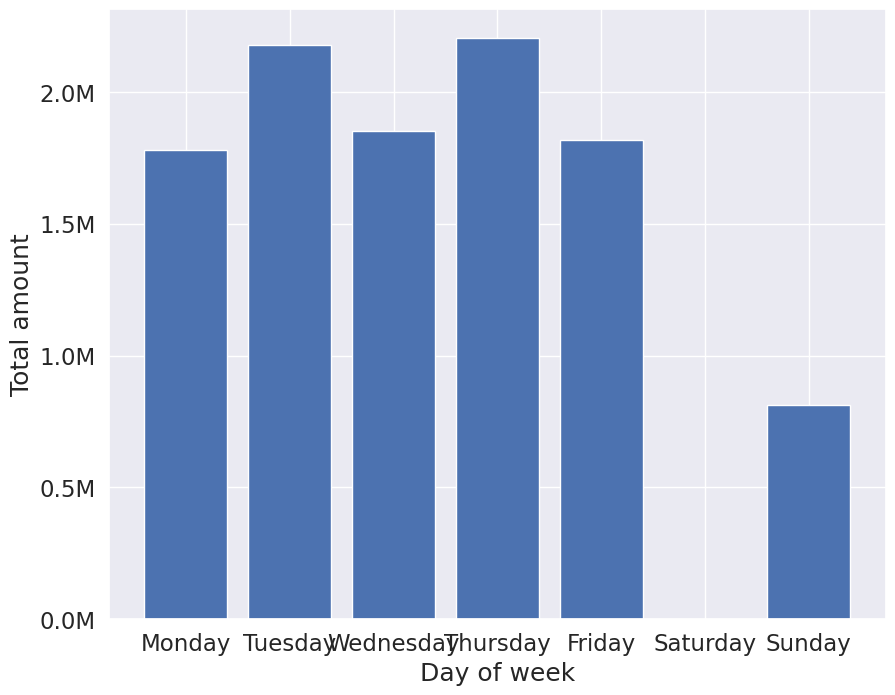

In [ ]:
# Xem vài dòng đầu để kiểm tra
online_retail_df_cleaned.head()

# Thêm cột ngày trong tuần từ InvoiceDate
online_retail_df_cleaned['Day_of_week'] = online_retail_df_cleaned['InvoiceDate'].dt.day_name()

# Tính tổng doanh thu theo từng ngày trong tuần
daily_sales = online_retail_df_cleaned.groupby('Day_of_week')['TotalAmount'].sum()

# Sắp xếp lại thứ trong tuần theo thứ tự chuẩn
order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
daily_sales = daily_sales.reindex(order)

# Vẽ bar chart
plt.figure(figsize=(9,7))
plt.bar(daily_sales.index, daily_sales.values)

# Định dạng trục y sang triệu (M)
ax = plt.gca()
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M'))

plt.tight_layout()
plt.xlabel('Day of week')
plt.ylabel('Total amount')

- `online_retail_df_cleaned['InvoiceDate'].dt.day_name()` → lấy tên ngày trong tuần từ cột `InvoiceDate`.  
- `groupby('Day_of_week')['TotalAmount'].sum()` → tính **tổng doanh thu** cho từng ngày trong tuần.  
- `order = [...]` + `reindex(order)` → sắp xếp thứ tự ngày từ Monday → Sunday.  
- `plt.bar(...)` → vẽ biểu đồ cột doanh thu theo ngày.  
- `mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M')` → hiển thị trục y theo đơn vị triệu (M).  

**👉 Nhận xét:**  
- Doanh thu cao nhất vào **Thursday** và **Tuesday**, khoảng trên 2 triệu.  
- **Sunday** là ngày doanh thu thấp nhất, chưa tới 1 triệu.  
- Nhìn chung, các ngày trong tuần (Mon–Fri) bán tốt hơn, còn cuối tuần (Sat–Sun) doanh thu giảm mạnh.  

#### Top 10 mặt hàng bán chạy nhất all time


Text(50.0, 0.5, 'Total Sales (Millions)')

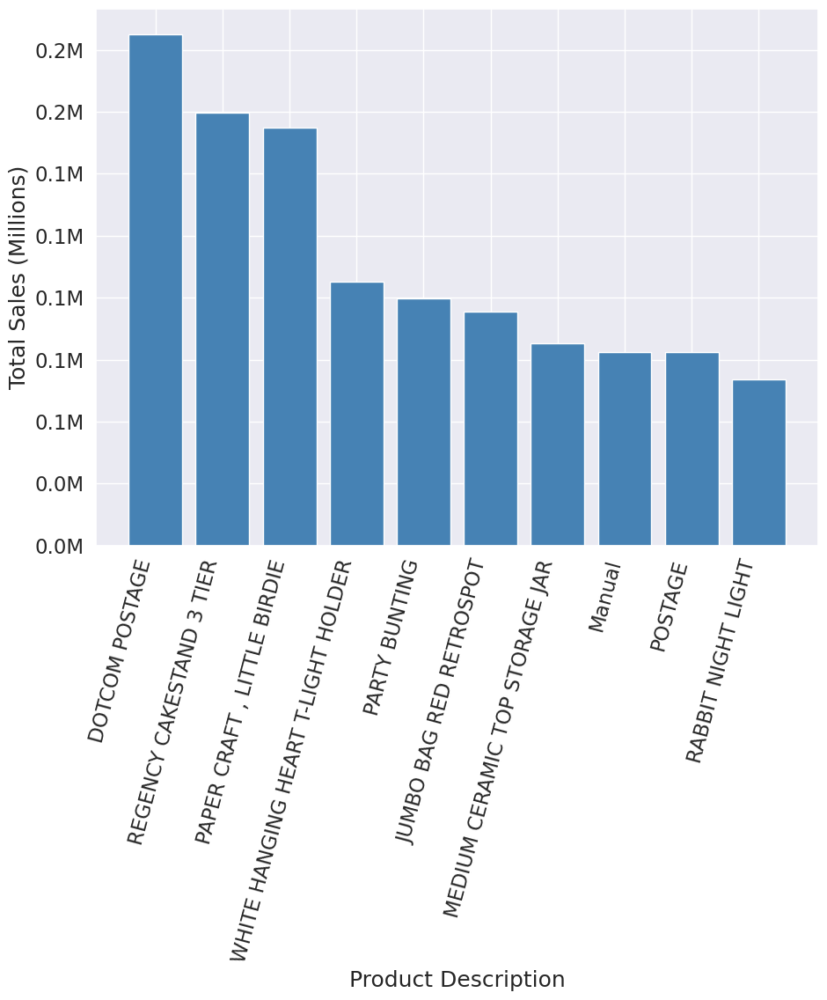

In [ ]:
# Tính tổng doanh thu theo từng sản phẩm (Description)
item_total_sell_most = online_retail_df_cleaned.groupby('Description')['TotalAmount'].sum()

# Lấy top 10 sản phẩm bán chạy nhất theo doanh thu
most_value = item_total_sell_most.sort_values(ascending=False).head(10)

# Vẽ bar chart
plt.figure(figsize=(10,7))
plt.bar(most_value.index, most_value.values, color='steelblue')

# Định dạng trục y sang đơn vị triệu (M)
ax = plt.gca()
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M'))

plt.tight_layout()
plt.xticks(rotation=75, ha='right')
plt.xlabel('Product Description')
plt.ylabel('Total Sales (Millions)')

- `groupby('Description')['TotalAmount'].sum()` → tính **tổng doanh thu** cho từng sản phẩm.  
- `sort_values(ascending=False).head(10)` → lấy ra **10 sản phẩm có doanh thu cao nhất**.  
- `plt.bar(...)` → vẽ biểu đồ cột doanh thu theo sản phẩm.  
- `mtick.FuncFormatter(lambda v, p: f'{v/1e6:.1f}M')` → hiển thị trục y theo đơn vị **triệu (M)**.  
- `xticks(rotation=75)` → xoay nhãn tên sản phẩm để dễ đọc.  

**👉 Nhận xét:**  
- Sản phẩm **DOTCOM POSTAGE** có doanh thu cao nhất, vượt trội so với các mặt hàng khác.  
- Các sản phẩm thuộc nhóm **trang trí/đồ gia dụng** (ví dụ: `HANGING HEART T-LIGHT HOLDER`, `PARTY BUNTING`, `STORAGE JAR`...) chiếm nhiều trong top bán chạy.  
- Doanh thu của sản phẩm top 1 cao hơn hẳn so với nhóm còn lại, thể hiện sự mất cân đối trong cơ cấu bán hàng.  


# **III. Phân tích dữ liệu đơn biến và hai biến**


#Bài tập: Thực hiện các yêu cầu sau:
+ Tìm hiểu các tính năng và cách sử dụng sản phẩm SweetViz (https://pypi.org/project/sweetviz)
+ Tìm hiểu các tính năng và cách sử dụng sản phẩm AutoViz (https://pypi.org/project/autoviz) <br>
Note: Áp dụng trên tập dữ liệu Marketing Campaign: https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis


### **1. TỔNG QUAN (Phần chung cho cả 3 phần bài tập)**

#### 1.1. Tóm tắt bài toán


<!-- Mô tả sơ vấn đề bài toán -->
Mô tả bài toán:
+ Phân tích tính cách khách hàng là một phân tích chi tiết về những khách hàng lý tưởng của một công ty. Nó giúp doanh nghiệp hiểu rõ hơn về khách hàng của mình và giúp họ dễ dàng điều chỉnh sản phẩm theo nhu cầu, hành vi và mối quan tâm cụ thể của các loại khách hàng khác nhau.

+ Phân tích tính cách khách hàng giúp doanh nghiệp điều chỉnh sản phẩm của mình dựa trên các khách hàng mục tiêu từ các phân khúc khách hàng khác nhau. Ví dụ, thay vì chi tiền để tiếp thị một sản phẩm mới cho mọi khách hàng trong cơ sở dữ liệu của công ty, một công ty có thể phân tích phân khúc khách hàng nào có nhiều khả năng mua sản phẩm nhất và sau đó chỉ tiếp thị sản phẩm đó trên phân khúc cụ thể đó.

#### 1.2. Mô tả các biến


<!-- Giải thích sơ các biến -->
I. Biến Định Danh và Thời gian (Identification and Time Variables)

*   **ID**: Mã định danh (ID) duy nhất cho mỗi khách hàng.
*   **Year\_Birth**: Năm sinh của khách hàng. (Lưu ý: Quan sát cho thấy có các giá trị năm sinh đa dạng, ví dụ: 1957, 1954, hoặc thậm chí 1893 và 1996, cần kiểm tra tính hợp lệ của dữ liệu tuổi).
*   **Dt\_Customer**: Ngày khách hàng đăng ký trở thành thành viên của công ty (được ghi nhận dưới dạng DD-MM-YYYY, ví dụ: 04-09-2012).
*   **Recency**: Số ngày kể từ lần mua hàng cuối cùng của khách hàng (giá trị từ 0 đến 99 ngày được quan sát). <br>

II. Biến Nhân khẩu học (Demographic Variables)

*   **Education**: Trình độ học vấn của khách hàng. Các cấp độ quan sát được bao gồm: Graduation (Tốt nghiệp), PhD (Tiến sĩ), Master (Thạc sĩ), 2n Cycle (Hệ 2 năm/Cao đẳng), và Basic (Cơ bản).
*   **Marital\_Status**: Tình trạng hôn nhân của khách hàng. Các trạng thái quan sát được bao gồm: Single (Độc thân), Together (Sống chung), Married (Đã kết hôn), Divorced (Đã ly hôn), Widow (Góa phụ). (Lưu ý: Các trạng thái ít phổ biến như Alone và Absurd cũng xuất hiện).
*   **Income**: Thu nhập hộ gia đình hàng năm của khách hàng (giá trị tiền tệ).
*   **Kidhome**: Số lượng trẻ nhỏ (dưới 18 tuổi) trong gia đình (ví dụ: 0, 1, 2).
*   **Teenhome**: Số lượng thanh thiếu niên (từ 18 tuổi trở lên) trong gia đình (ví dụ: 0, 1, 2). <br>

III. Biến Chi tiêu Sản phẩm (Product Expenditure Variables)

Các biến này đo lường tổng số tiền đã chi tiêu cho các danh mục sản phẩm khác nhau trong 2 năm gần nhất:

*   **MntWines**: Số tiền đã chi cho Rượu.
*   **MntFruits**: Số tiền đã chi cho Trái cây.
*   **MntMeatProducts**: Số tiền đã chi cho Sản phẩm Thịt.
*   **MntFishProducts**: Số tiền đã chi cho Sản phẩm Cá.
*   **MntSweetProducts**: Số tiền đã chi cho Sản phẩm Ngọt.
*   **MntGoldProds**: Số tiền đã chi cho Sản phẩm Vàng (Gold products). <br>

IV. Biến Hoạt động và Kênh Mua hàng (Activity and Channel Variables)

Các biến này đếm số lần mua hàng thông qua các kênh khác nhau và số lần truy cập website:

*   **NumDealsPurchases**: Số lần mua hàng được thực hiện bằng cách sử dụng chiết khấu/ưu đãi (giá trị tối đa lên tới 15 lần được quan sát).
*   **NumWebPurchases**: Số lần mua hàng được thực hiện qua trang web của công ty (giá trị tối đa lên tới 11 lần được quan sát).
*   **NumCatalogPurchases**: Số lần mua hàng được thực hiện bằng cách sử dụng catalogue.
*   **NumStorePurchases**: Số lần mua hàng được thực hiện trực tiếp tại cửa hàng (giá trị tối đa lên tới 13 lần được quan sát).
*   **NumWebVisitsMonth**: Số lần truy cập vào trang web của công ty trong tháng gần nhất (giá trị tối đa lên tới 20 lần được quan sát).<br>

V. Biến Phản hồi Chiến dịch và Hệ thống (Campaign Response and System Variables)

Các biến này là các biến nhị phân (0 hoặc 1), cho biết khách hàng có chấp nhận đề nghị trong các chiến dịch tiếp thị hay không, hoặc có thực hiện khiếu nại hay không.

*   **AcceptedCmp1**: 1 nếu khách hàng chấp nhận ưu đãi trong Chiến dịch 1, 0 nếu không.
*   **AcceptedCmp2**: 1 nếu khách hàng chấp nhận ưu đãi trong Chiến dịch 2, 0 nếu không.
*   **AcceptedCmp3**: 1 nếu khách hàng chấp nhận ưu đãi trong Chiến dịch 3, 0 nếu không.
*   **AcceptedCmp4**: 1 nếu khách hàng chấp nhận ưu đãi trong Chiến dịch 4, 0 nếu không.
*   **AcceptedCmp5**: 1 nếu khách hàng chấp nhận ưu đãi trong Chiến dịch 5, 0 nếu không.
*   **Response**: 1 nếu khách hàng chấp nhận ưu đãi trong chiến dịch gần nhất (thường là Chiến dịch 6), 0 nếu không. Đây thường là biến mục tiêu quan trọng trong phân tích mô hình dự đoán.
*   **Complain**: 1 nếu khách hàng có khiếu nại trong 2 năm gần nhất, 0 nếu không.<br>

VI. Ngoài ra, còn có hai cột có giá trị cố định trong các bản ghi được cung cấp:

*   **Z\_CostContact**: Giá trị luôn là **3** trong tất cả các bản ghi.
*   **Z\_Revenue**: Giá trị luôn là **11** trong tất cả các bản ghi.

### **2. THỰC HÀNH**


#### 2.1. Tìm hiểu các tính năng và cách sử dụng sản phẩm SweetViz (https://pypi.org/project/sweetviz)

Tải thư viện cần thiết:

In [ ]:
!pip install sweetviz

Import thư viện

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
import numpy as np
data = pd.read_csv("/content/sample_data/Data/marketing_campaign.csv", sep="\t")
data.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


<h3>Kiểm tra sơ bộ dữ liệu</h3>

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [ ]:
data.isnull().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,24
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


##### 2.1.1. Phân tích dữ liệu đơn biến

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag


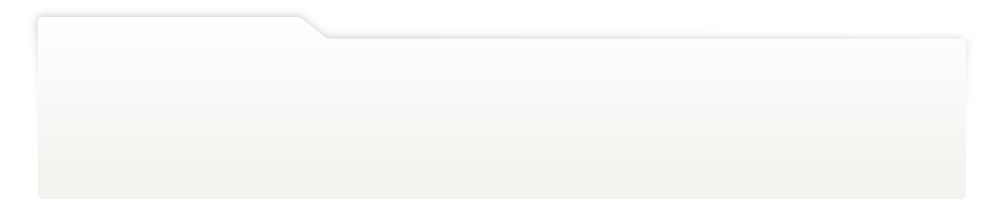
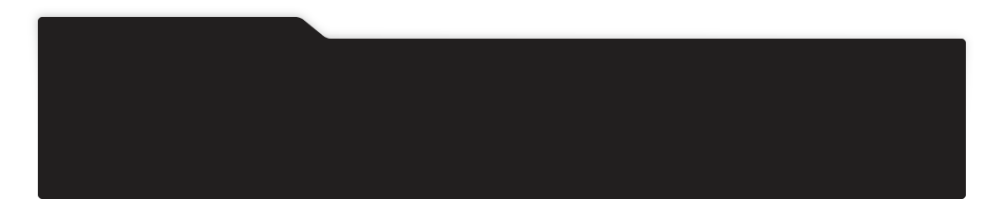
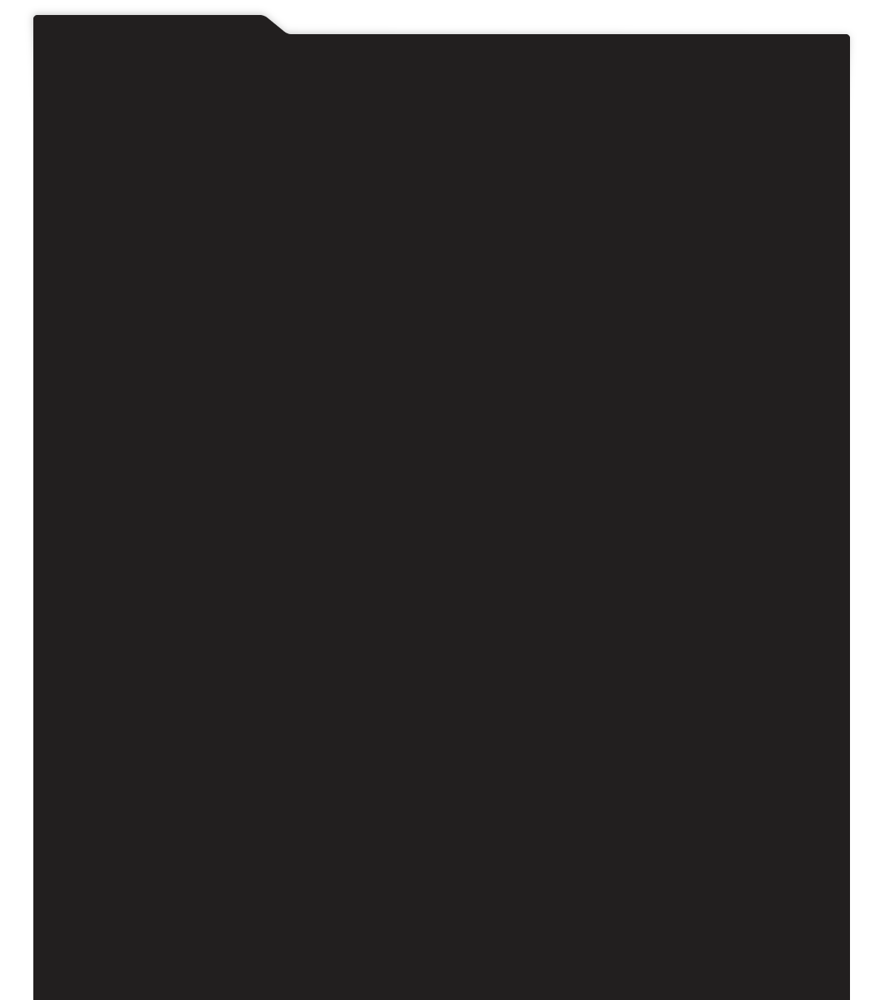
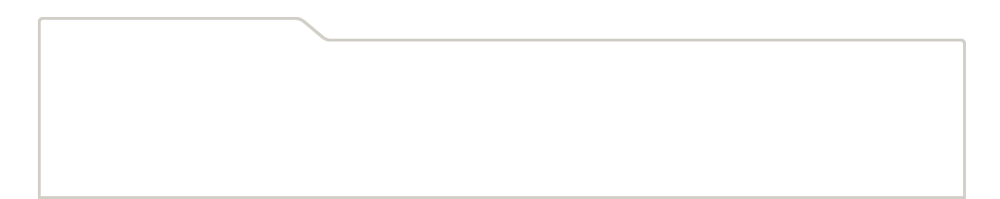
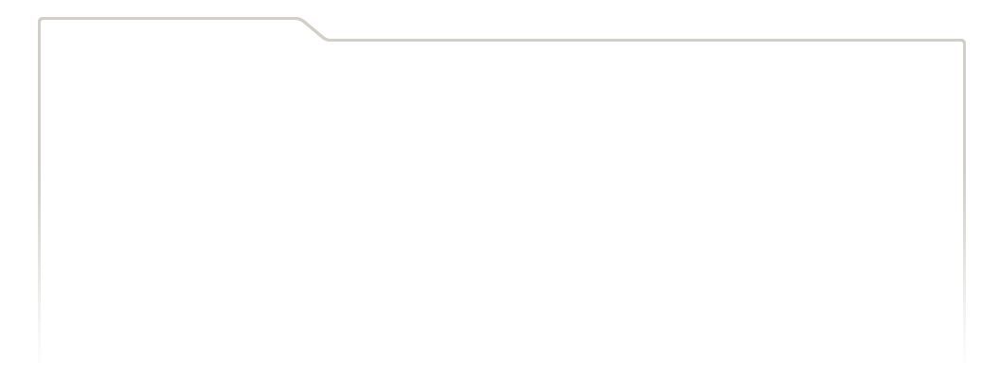
...
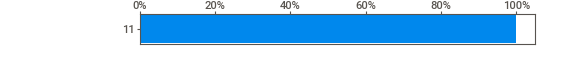
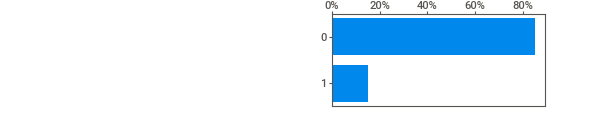
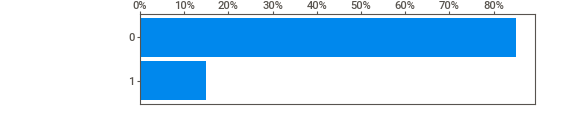
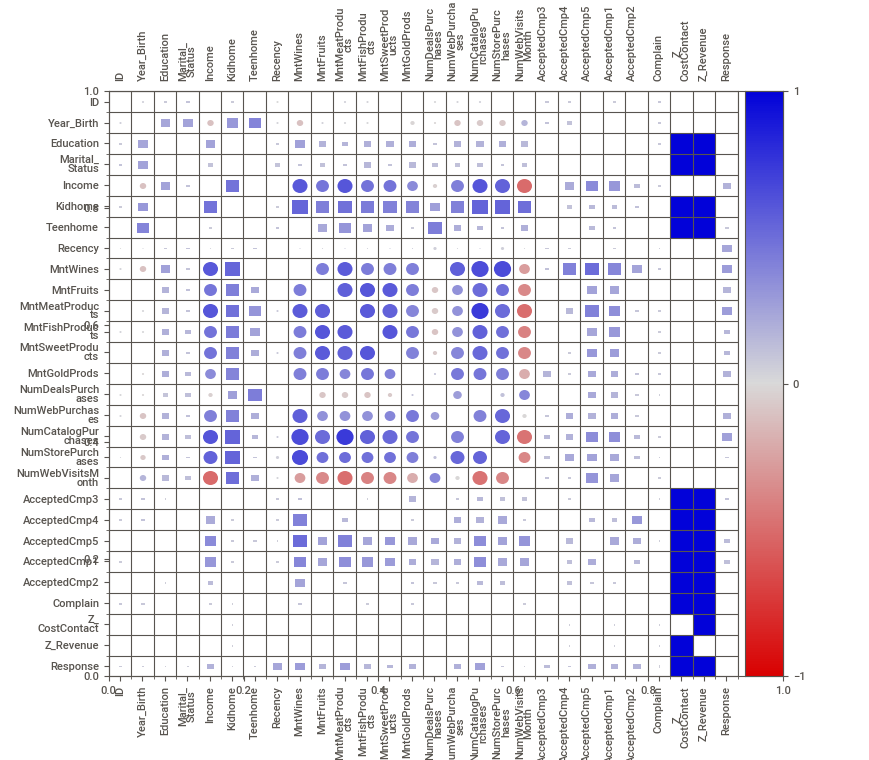
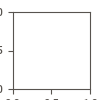

In [ ]:
# Vá lỗi do SweetViz gọi nhầm DeprecationWarning trong numpy 2.x
if not hasattr(np, 'VisibleDeprecationWarning'):
    np.VisibleDeprecationWarning = DeprecationWarning
# Phân tích bằng sweetviz
report = sv.analyze(data)
# Show ra notebook đã phân tích
report.show_notebook()

Với dữ liệu thu được từ notebook sau khi phân tích bằng sweetviz ta có thống kê như sau: <br>
*Tất cả các cột đều không có missing value* <br>
*Riêng cột Income có 24 missing values* <br>
+ Year_Birth: Có outlier (giá trị ngoài khoảng hợp lý). Các năm sinh như 1893, 1899, và 1900 là những giá trị ngoại lai về mặt logic/thực tế, cần được kiểm tra và xử lý.
+ Education: Không vấn đề. Các cấp độ học vấn (Graduation, PhD, Master, 2n Cycle, Basic) đều là các giá trị hợp lý trong danh mục phân loại.
+ Marital_Status: Có các nhóm hiếm và đáng ngờ như Alone, Absurd, và YOLO → nên gộp các nhóm này vào một nhóm "Other" để đơn giản hóa mô hình hóa và đảm bảo tính đại diện cho các nhóm dữ liệu ít phổ biến.
+ Income: Có nhiều outlier (ví dụ: 666,666, 162,397, 157,733) cho thấy sự lệch phải mạnh mẽ. Ngoài ra, sự xuất hiện của các giá trị thu nhập bằng 0 hoặc 1 là những dấu hiệu rõ ràng của dữ liệu bị thiếu hoặc lỗi nhập liệu. (Giả định theo yêu cầu của bạn, tồn tại 24 giá trị thiếu cần được impute hoặc loại bỏ).
+ Dt_Customer: Có quá nhiều giá trị khác nhau (high cardinality) do mỗi khách hàng có một ngày đăng ký riêng biệt. Tùy thuộc vào mục tiêu phân tích, cột này nên được chuyển đổi thành một biến tính toán hữu ích hơn, chẳng hạn như "Số ngày làm thành viên" hoặc "Thời gian đăng ký" (Enrollment Period).
+ Các biến chi tiêu (MntWines, MntFruits, MntMeatProducts, …): Có nhiều outlier (ví dụ: MntWines $1492$, MntMeatProducts $1725$), thể hiện độ lệch phải mạnh do một số khách hàng có mức chi tiêu rất lớn. Cần áp dụng các phép biến đổi logarit cho các biến này.
+ Các biến mua hàng (NumDealsPurchases, NumWebPurchases, …): Có outlier. Các giá trị tần suất mua hàng cực cao (ví dụ: NumDealsPurchases là $15$, NumCatalogPurchases là $28$, NumWebVisitsMonth là $20$) cho thấy hành vi giao dịch ngoại lệ so với khách hàng trung bình.
+ Các biến nhị phân (AcceptedCmp1-5, Complain, Response): Không vấn đề về cấu trúc (là 0/1). Tuy nhiên, cần lưu ý đến mất cân bằng lớp (class imbalance) khi mô hình hóa (tức là số lượng khách hàng phản hồi tích cực (1) ít hơn rất nhiều so với khách hàng không phản hồi (0)).

##### 2.1.2. Phân tích dữ liệu đa biến


<h3>NoteBook tạo biểu đồ chi tiêu theo nhóm</h3>

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag


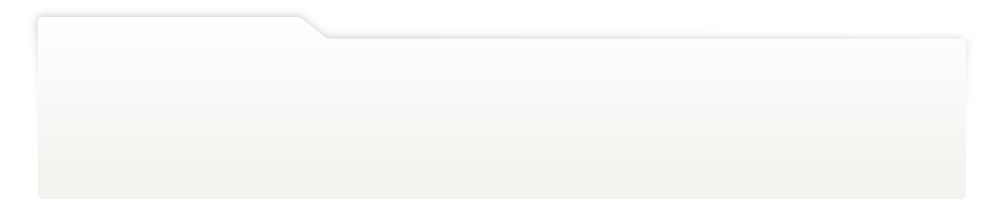
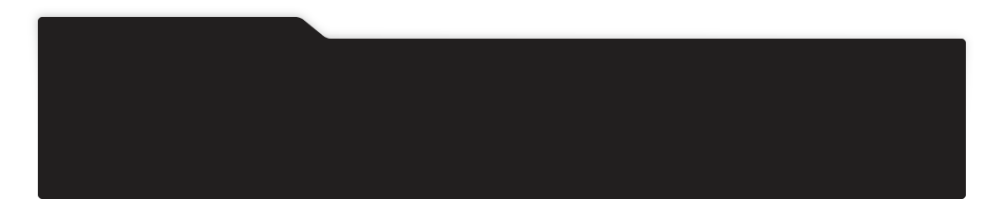
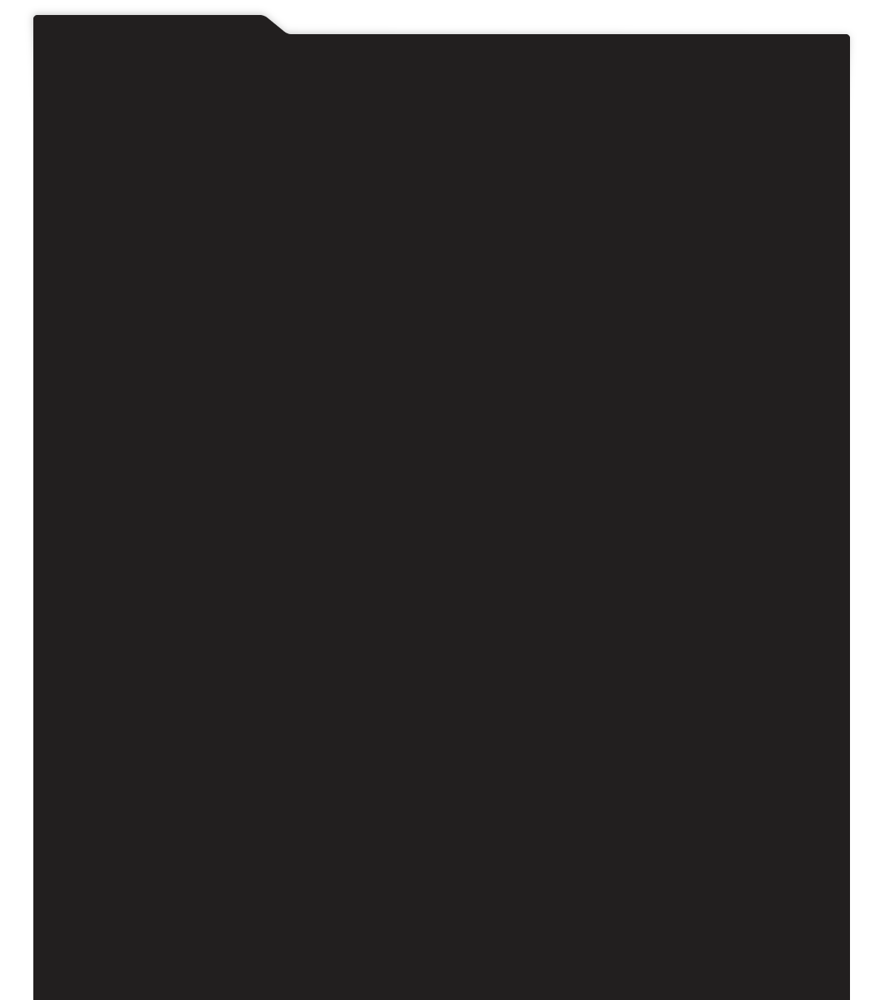
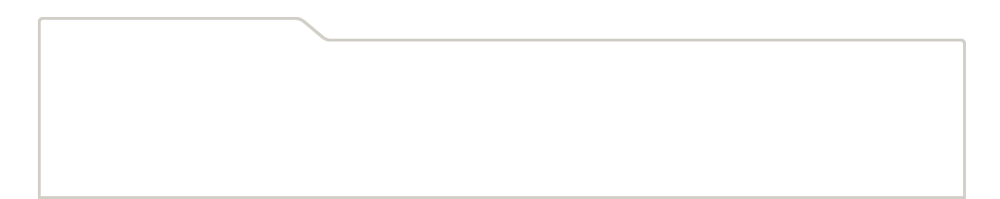
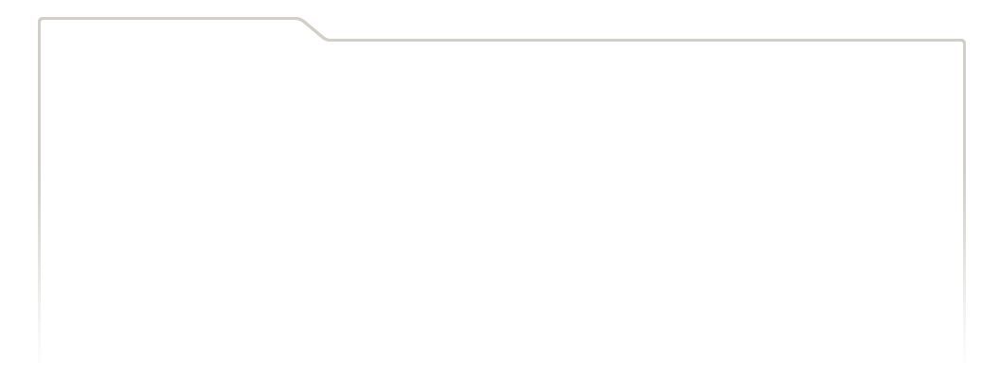
...
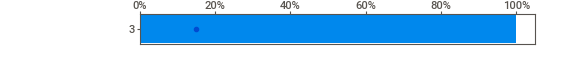
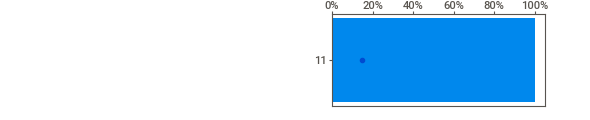
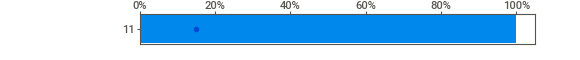
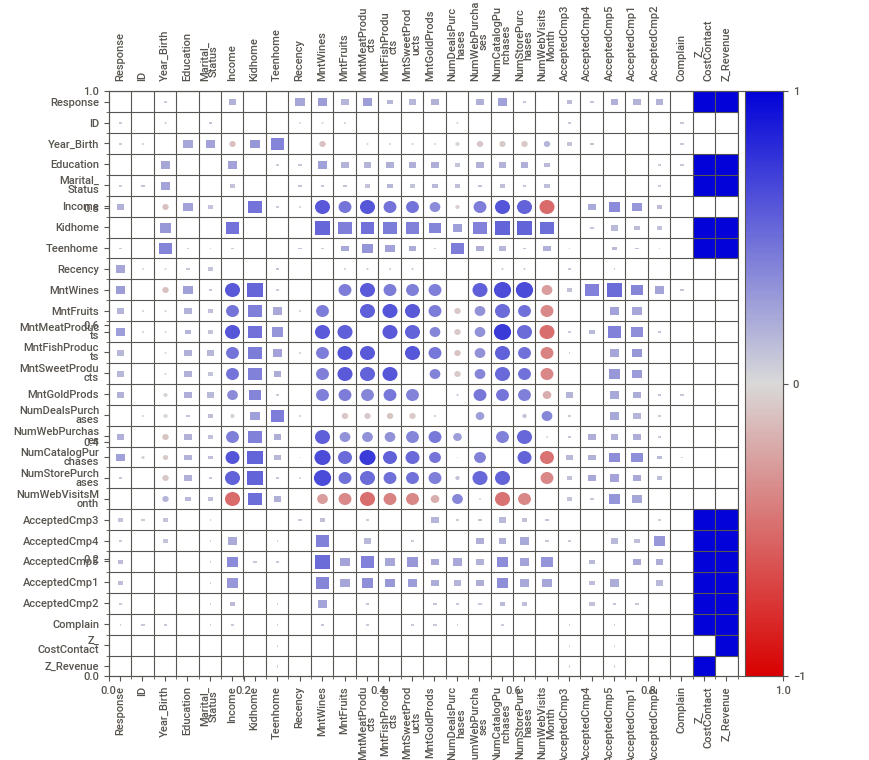
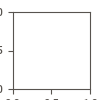

In [ ]:
report = sv.analyze(data, target_feat="Response")
report.show_notebook()

<h3>Biểu đồ tương quan</h3>

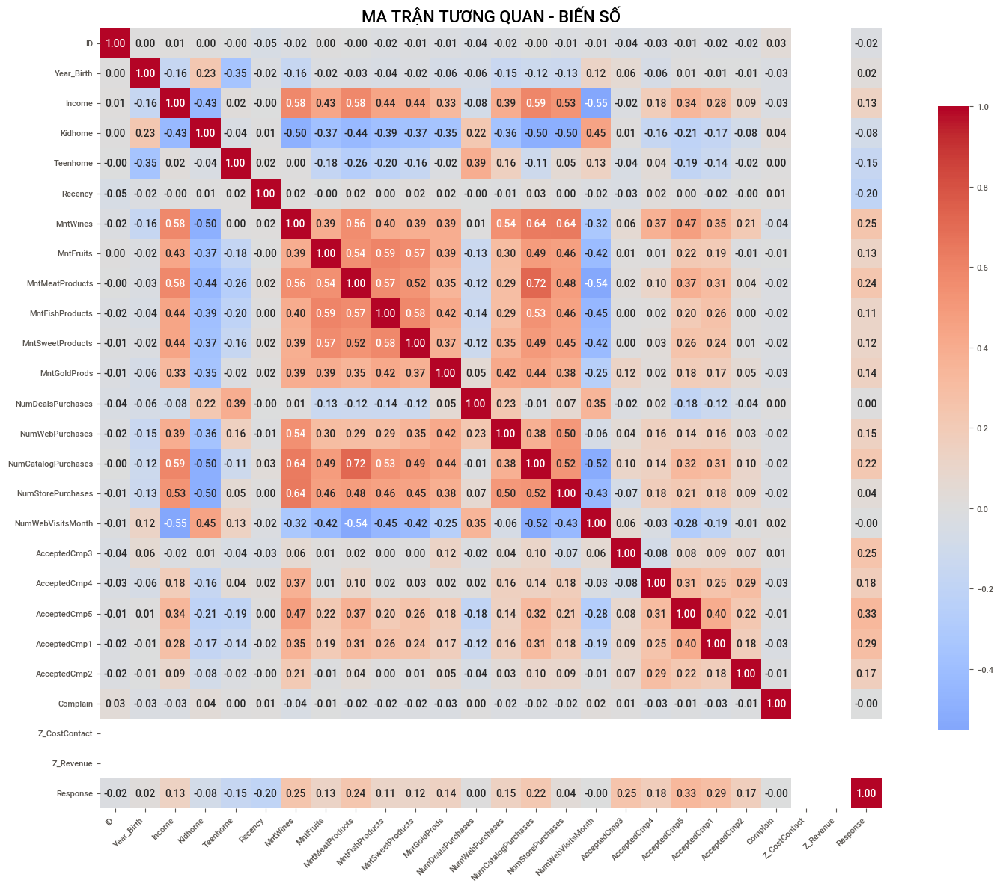

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Tính ma trận tương quan
numerical_data = data.select_dtypes(include=[np.number])
correlation_matrix = numerical_data.corr()

# Vẽ heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            fmt='.2f',
            square=True,
            cbar_kws={"shrink": .8})
plt.title('MA TRẬN TƯƠNG QUAN - BIẾN SỐ', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

1. **Mối quan hệ MẠNH NHẤT (|r| > 0.5)** <br>
Income - MntWines (0.59) <br>
Income - MntMeatProducts (0.58) <br>
-> Thu nhập cao -> Chi tiêu nhiều cho rượu và thịt
Income - NumCatalogPurchases (0.59) <br>
MntWines - NumCatalogPurchases (0.64) <br>
MntMeatProducts - NumCatalogPurchases (0.72) <br>
-> Mua qua catalog -> Chi tiêu lớn (đặc biệt thịt và rượu)
2. **Mối quan hệ với biến mục tiêu RESPONSE** <br>
AcceptedCmp5 (0.33) <br>
AcceptedCmp1 (0.29) <br>
AcceptedCmp2 (0.17) <br>
-> Chiến dịch 5 hiệu quả nhất (r = 0.33) <br>
MntWines (0.25) <br>
NumCatalogPurchases (0.22) <br>
-> Khách hàng chi nhiều cho rượu/thịt dễ phản hồi chiến dịch <br>
3. **Mối quan hệ ít tương quan đáng chú ý**
Recency - Response (-0.20) <br>
-> Mua lâu - Tỉ lệ phản hồi cao <br>
NumDealsPurchases - MntWines (-0.05) <br>
-> Mua deal - ít mua rượu cao cấp <br>
Teenhome - NumStorePurchases (0.05) <br>
-> Có con teen -> ít ra cửa hàng

#### 2.2. Tìm hiểu các tính năng và cách sử dụng sản phẩm AutoViz (https://pypi.org/project/autoviz)

##### 2.2.1. Phân tích dữ liệu đơn biến

In [ ]:
!pip install autoviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.5/67.5 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 40.5 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 3.0.5
    Uninstalling xgboost-3.0.5:
      Successfully uninstalled xgboost-3.0.5


In [ ]:
# Thực hiện code ở đây (giống trong file pdf)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from autoviz.AutoViz_Class import AutoViz_Class


In [ ]:
df = pd.read_csv("marketing_campaign.csv", sep="\t")
AV = AutoViz_Class()

df_uni = AV.AutoViz(
    "",
    dfte=df,
    depVar="",   # để trống = univariate
)

Shape of your Data Set loaded: (2240, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  15
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    29 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['ID', 'Z_CostContact', 'Z_Revenue']
To fix these data quality issu

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ID,int64,0.000000,100,0.000000,11191.000000,Possible ID column: drop before modeling step.
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.071429,NA,1730.000000,666666.000000,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (118350.50) or lower than lower bound(-14525.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,29,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,34,0.000000,1493.000000,Column has 35 outliers greater than upper bound (1225.00) or lower than lower bound(-697.00). Cap them or remove them.


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Dt_Customer. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 6 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


# 📊 Giải thích kết quả AutoViz cho Marketing Campaign Dataset

### 1. Kích thước dữ liệu
- Dataset có **2240 dòng** và **29 cột**.

### 2. Phân loại biến
- Numeric Columns: 1  
- Integer-Categorical Columns: 15  
- String-Categorical Columns: 2  
- Numeric-Boolean Columns: 7  
- ID Columns: 1 → `ID` (nên loại bỏ)  
- Low information columns: `Z_CostContact`, `Z_Revenue` (có giá trị không thay đổi, nên loại bỏ)

### 3. Báo cáo chất lượng dữ liệu (DQ Report)
- `Year_Birth`: Có outlier (giá trị ngoài khoảng hợp lý).  
- `Education`: Không vấn đề.  
- `Marital_Status`: Có các nhóm hiếm như `Alone`, `Absurd`, `YOLO` → nên gộp vào nhóm "Other".  
- `Income`: Có **24 giá trị thiếu** và nhiều outlier (ví dụ 666,666).  
- `Dt_Customer`: Có quá nhiều giá trị khác nhau (high cardinality) → nên mã hóa hoặc xử lý lại.  
- Các biến chi tiêu (`MntWines`, `MntFruits`, `MntMeatProducts`, …): Có nhiều outlier.  
- Các biến mua hàng (`NumDealsPurchases`, `NumWebPurchases`, …): Có outlier.  
- Các biến nhị phân (`AcceptedCmp1-5`, `Complain`, `Response`): Không vấn đề.

### 4. Lưu ý từ AutoViz
- Đã tự động loại bỏ các cột: `['ID', 'Z_CostContact', 'Z_Revenue']`.  
- Gợi ý xử lý dữ liệu:
  - Loại bỏ hoặc thay thế giá trị thiếu (`Income`).  
  - Gộp nhóm hiếm trong `Marital_Status`.  
  - Xử lý outlier (cắt giá trị hoặc dùng winsorization).  
  - Mã hóa `Dt_Customer` nếu muốn dùng trong mô hình.  

### 5. Thông báo thêm
- AutoViz cố vẽ **WordCloud** cho `Dt_Customer` nhưng thất bại (do là dữ liệu ngày tháng).  
- Đây không ảnh hưởng đến phân tích chính.  

---
✅ **Kết luận**: AutoViz đã giúp ta nhanh chóng nhận diện **biến ID**, **cột ít thông tin**, **outlier**, và **missing values** trong dữ liệu Marketing Campaign.



<!-- Giải thích code -->
Giải thích code

##### 2.2.2. Phân tích dữ liệu đa biến


In [ ]:
# Thực hiện code ở đây (giống trong file pdf)
df_multi = AV.AutoViz(
    "",
    dfte=df,
    depVar="Response"
)


Shape of your Data Set loaded: (2240, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  15
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  6
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    28 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['ID', 'Z_CostContact', 'Z_Revenue']

################ Binary_Class

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.166181,NA,1730.000000,666666.000000,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (117909.50) or lower than lower bound(-13900.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,32,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,37,0.000000,1493.000000,Column has 33 outliers greater than upper bound (1225.50) or lower than lower bound(-698.50). Cap them or remove them.
MntFruits,int64,0.000000,7,0.000000,199.000000,Column has 207 outliers greater than upper bound (81.00) or lower than lower bound(-47.00). Cap them or remove them.


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Dt_Customer. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


# 📊 Giải thích kết quả AutoViz (Marketing Campaign)

### 1. Thông tin chung
- Dataset sau khi load: **2240 dòng, 29 cột**  
- AutoViz tự động loại bỏ 3 cột ít thông tin: `['ID', 'Z_CostContact', 'Z_Revenue']`  
- Phát hiện: có **182 dòng trùng lặp** → nên cân nhắc loại bỏ  

### 2. Loại biến
- Numeric Columns: 1  
- Integer-Categorical: 15  
- String-Categorical: 2  
- Numeric-Boolean: 6  
- Discrete String: 1  
- ID Column: 1  
- DateTime Columns: 0  

### 3. Báo cáo chất lượng dữ liệu (DQ Report)
- **Year_Birth**: có 3 giá trị outlier (trước 1932 hoặc sau 2004).  
- **Marital_Status**: có 3 nhóm hiếm `['Alone', 'Absurd', 'YOLO']` → nên gộp thành “Other”.  
- **Income**: có 24 giá trị thiếu, và outlier (tối đa 666,666).  
- **Dt_Customer**: high cardinality (663 giá trị khác nhau) → mã hóa hoặc bỏ.  
- **Các cột chi tiêu** (`MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds`): có rất nhiều outlier.  
- **Các cột mua hàng** (`NumDealsPurchases`, `NumWebPurchases`, `NumCatalogPurchases`, `NumWebVisitsMonth`): có outlier.  
- **Các biến nhị phân** (`AcceptedCmp1–5`, `Complain`, `Response`): ổn định, không vấn đề.  

### 4. Lưu ý từ AutoViz
- Đây là **Binary Classification problem** (biến mục tiêu: `Response`).  
- Có duplicate rows → cần xử lý trước khi train model.  
- AutoViz cố vẽ WordCloud cho `Dt_Customer` nhưng thất bại (do là ngày tháng, không phải text).  

### 5. Kết luận
- Dataset cần tiền xử lý:
  - Loại bỏ/điều chỉnh outlier.  
  - Xử lý missing value (`Income`).  
  - Gộp nhóm hiếm (`Marital_Status`).  
  - Loại bỏ ID, low-information columns.  
  - Cân nhắc mã hóa `Dt_Customer`.  
  - Loại bỏ các dòng trùng lặp.  
- Sau bước cleaning, dữ liệu có thể dùng để xây dựng mô hình phân loại (`Response` = 0/1).


<!-- Giải thích code -->
Giải thích code

##### 2.2.3. Vẽ biểu đồ Phân tích dữ liệu đơn biến và đa biến

In [ ]:

df_auto = AV.AutoViz(
    filename="",        # để trống nếu dùng dataframe
    sep=",",
    depVar="Response",  # biến mục tiêu (target)
    dfte=df,            # dataframe đã load sẵn
    header=0,
    verbose = 2
)
plt.show()

Shape of your Data Set loaded: (2240, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing up to 30 columns (max) in each category:
    Numeric Columns : ['Income']
    Integer-Categorical Columns: ['Year_Birth', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']
    String-Categorical Columns: ['Education', 'Marital_Status']
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain']
    Discrete String Columns: ['Dt_

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.166181,NA,1730.000000,666666.000000,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (117909.50) or lower than lower bound(-13900.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,32,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,37,0.000000,1493.000000,Column has 33 outliers greater than upper bound (1225.50) or lower than lower bound(-698.50). Cap them or remove them.
MntFruits,int64,0.000000,7,0.000000,199.000000,Column has 207 outliers greater than upper bound (81.00) or lower than lower bound(-47.00). Cap them or remove them.


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Dt_Customer. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots are saved in ./AutoViz_Plots/Response
Time to run AutoViz = 10 seconds 


In [ ]:

import os, cairosvg
from IPython.display import Image, display

plot_folder = "AutoViz_Plots/Response"

# List tên file theo loại
univariate_files = [
    "Bar_Plots.svg",
    "Box_Plots.svg",
    "Dist_Plots_Numerics.svg",
    "Dist_Plots_target.svg"
]

multivariate_files = [
    "Scatter_Plots.svg",
    "Heat_Maps.svg"
]

def show_plots(files, title):
    print(f"\n📊 {title}:")
    for file in files:
        svg_path = os.path.join(plot_folder, file)
        if os.path.exists(svg_path):
            png_path = svg_path.replace(".svg", ".png")
            cairosvg.svg2png(url=svg_path, write_to=png_path)
            display(Image(filename=png_path))
        else:
            print(f"⚠️ Không tìm thấy {file}")



### load ảnh các biểu đồ

In [ ]:
!pip install cairosvg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.6 MB/s eta 0:00:00


## Biểu đồ đơn biến


📊 Biểu đồ Đơn biến (Univariate Analysis):


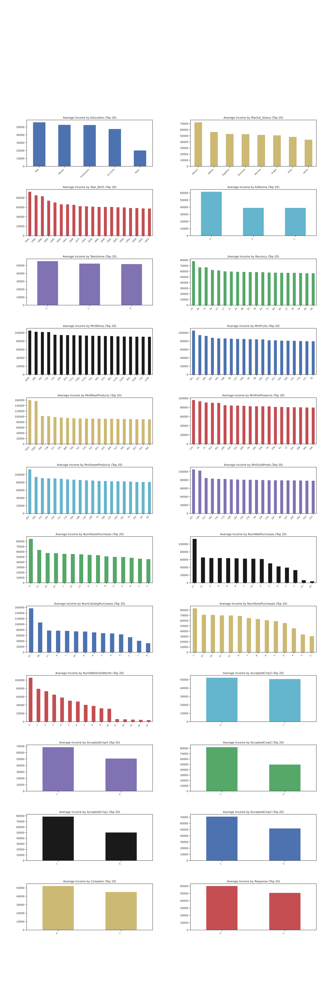

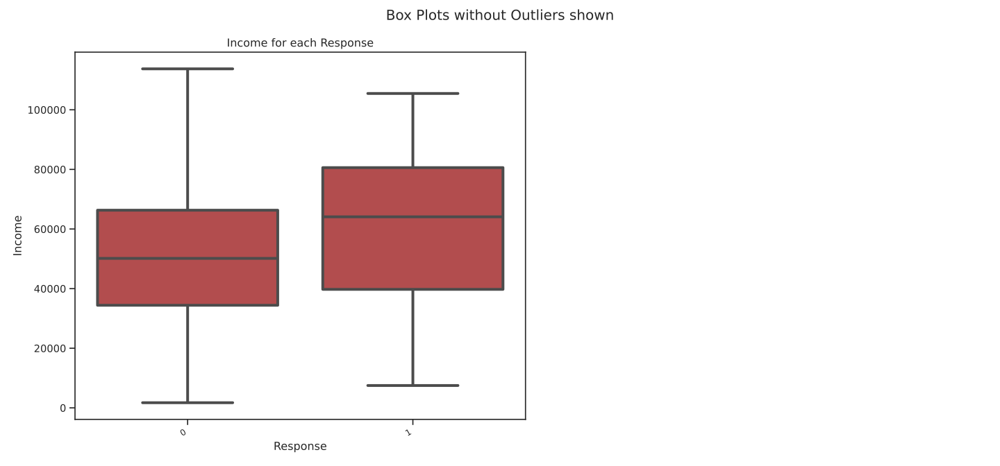

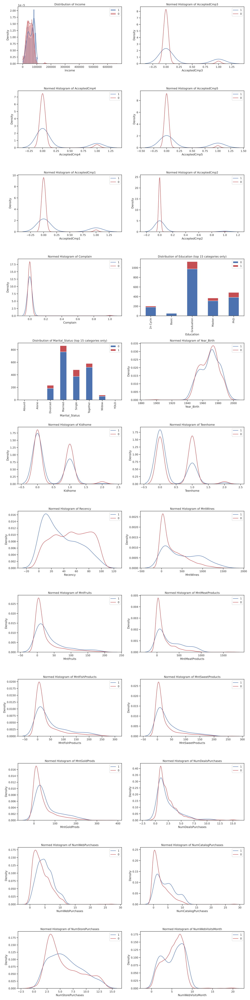

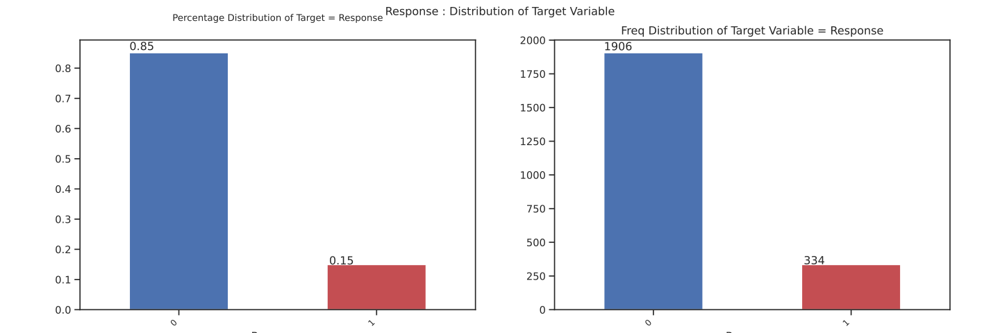

In [ ]:
show_plots(univariate_files, "Biểu đồ Đơn biến (Univariate Analysis)")


📊 Biểu đồ Đơn biến (Univariate Analysis)
1. Bar_Plots

Hiển thị tần số (frequency) của các giá trị rời rạc hoặc danh mục (categorical).

Giúp nhận biết biến nào phổ biến, biến nào ít xuất hiện.

Ví dụ: Education có bao nhiêu khách hàng theo từng mức học vấn.

2. Box_Plots

Biểu đồ dạng hộp (boxplot) cho biến số (numeric).

Thể hiện:

Median (giá trị trung vị)

Quartiles (Q1, Q3)

Outliers (giá trị bất thường)

Giúp phát hiện các giá trị ngoại lai và phân bố dữ liệu.

3. Dist_Plots_Numerics

Histogram + Kernel Density Estimate (KDE) cho các biến số.

Cho thấy phân bố dữ liệu: có nghiêng trái, nghiêng phải hay gần chuẩn (normal distribution).

Ví dụ: phân bố Income, Recency, MntWines.

4. Dist_Plots_target

Tương tự Dist_Plots_Numerics, nhưng dành cho biến mục tiêu (Response).

Giúp kiểm tra cân bằng lớp (class balance) nếu là bài toán phân loại nhị phân.

## Biểu đồ đa biến


📊 Biểu đồ Đa biến (Multivariate Analysis):


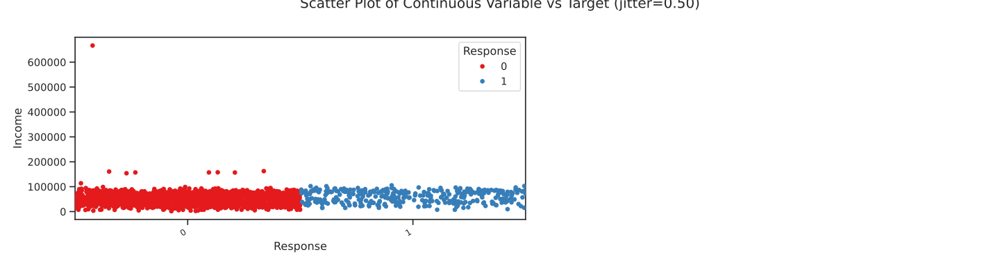

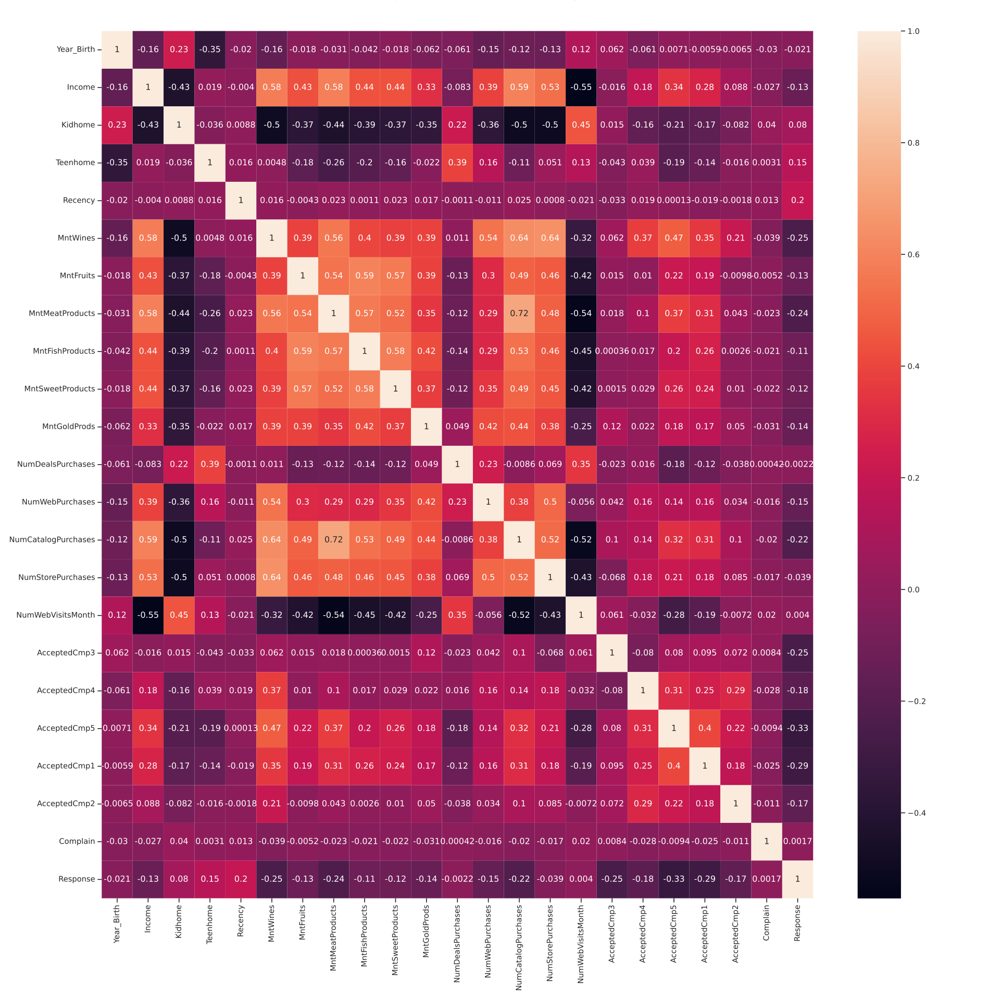

In [ ]:
show_plots(multivariate_files, "Biểu đồ Đa biến (Multivariate Analysis)")

🔗 Biểu đồ Đa biến (Multivariate Analysis)
1. Scatter_Plots

Biểu đồ tán xạ (scatter plot) giữa hai biến số.

Giúp nhận biết mối quan hệ, xu hướng, hoặc tương quan giữa các biến.

Ví dụ: Income vs MntWines để thấy khách thu nhập cao chi tiêu nhiều hơn không.

2. Heat_Maps

Ma trận tương quan (correlation matrix) giữa các biến số.

Màu sắc biểu diễn hệ số tương quan Pearson (-1 đến 1).

Giúp nhanh chóng phát hiện biến có tương quan cao/ thấp, từ đó có thể chọn biến hoặc xử lý đa cộng tuyến.

✅ Ghi chú:

Đơn biến giúp bạn hiểu từng thuộc tính riêng lẻ.

Đa biến giúp phân tích mối quan hệ giữa các thuộc tính với nhau và với biến mục tiêu.

Kết hợp cả hai loại sẽ có cái nhìn tổng quan và chi tiết về dữ liệu trước khi modeling.